* #### ANALYSIS ####

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

In [104]:
data = pd.read_csv(r'C:\Users\user\Desktop\Graduation-project-DEPI\Data\Bank Customer Churn Prediction.csv')
data.head(10)

,customer_id,credit_score,country,gender,age,tenure,balance,products_number,credit_card,active_member,estimated_salary,churn
0,15634602,619,France,Female,42,2,0.00,1,1,1,101348.88,1
1,15647311,608,Spain,Female,41,1,83807.86,1,0,1,112542.58,0
2,15619304,502,France,Female,42,8,159660.80,3,1,0,113931.57,1
3,15701354,699,France,Female,39,1,0.00,2,0,0,93826.63,0
4,15737888,850,Spain,Female,43,2,125510.82,1,1,1,79084.10,0
5,15574012,645,Spain,Male,44,8,113755.78,2,1,0,149756.71,1
6,15592531,822,France,Male,50,7,0.00,2,1,1,10062.80,0
7,15656148,376,Germany,Female,29,4,115046.74,4,1,0,119346.88,1
8,15792365,501,France,Male,44,4,142051.07,2,0,1,74940.50,0
9,15592389,684,France,Male,27,2,134603.88,1,1,1,71725.73,0


In [105]:
data.describe()

,customer_id,credit_score,age,tenure,balance,products_number,credit_card,active_member,estimated_salary,churn
count,1.000000e+04,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.00000,10000.000000,10000.000000,10000.000000
mean,1.569094e+07,650.528800,38.921800,5.012800,76485.889288,1.530200,0.70550,0.515100,100090.239881,0.203700
std,7.193619e+04,96.653299,10.487806,2.892174,62397.405202,0.581654,0.45584,0.499797,57510.492818,0.402769
min,1.556570e+07,350.000000,18.000000,0.000000,0.000000,1.000000,0.00000,0.000000,11.580000,0.000000
25%,1.562853e+07,584.000000,32.000000,3.000000,0.000000,1.000000,0.00000,0.000000,51002.110000,0.000000
50%,1.569074e+07,652.000000,37.000000,5.000000,97198.540000,1.000000,1.00000,1.000000,100193.915000,0.000000
75%,1.575323e+07,718.000000,44.000000,7.000000,127644.240000,2.000000,1.00000,1.000000,149388.247500,0.000000
max,1.581569e+07,850.000000,92.000000,10.000000,250898.090000,4.000000,1.00000,1.000000,199992.480000,1.000000


In [106]:
data.shape


(10000, 12)

In [107]:
data.isnull().sum()


customer_id         0
credit_score        0
country             0
gender              0
age                 0
tenure              0
balance             0
products_number     0
credit_card         0
active_member       0
estimated_salary    0
churn               0
dtype: int64

In [108]:
data.nunique()

customer_id         10000
credit_score          460
country                 3
gender                  2
age                    70
tenure                 11
balance              6382
products_number         4
credit_card             2
active_member           2
estimated_salary     9999
churn                   2
dtype: int64

In [109]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 12 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   customer_id       10000 non-null  int64  
 1   credit_score      10000 non-null  int64  
 2   country           10000 non-null  object 
 3   gender            10000 non-null  object 
 4   age               10000 non-null  int64  
 5   tenure            10000 non-null  int64  
 6   balance           10000 non-null  float64
 7   products_number   10000 non-null  int64  
 8   credit_card       10000 non-null  int64  
 9   active_member     10000 non-null  int64  
 10  estimated_salary  10000 non-null  float64
 11  churn             10000 non-null  int64  
dtypes: float64(2), int64(8), object(2)
memory usage: 937.6+ KB


In [110]:
print(data['age'].value_counts())

age
37    478
38    477
35    474
36    456
34    447
     ... 
92      2
82      1
88      1
85      1
83      1
Name: count, Length: 70, dtype: int64


In [111]:
data.loc[data['products_number'] == 4, 'products_number']=3

In [112]:
data['credit_score_seg'] = pd.cut(data['credit_score'], bins=[349, 500, 590, 620, 660, 690, 720, np.inf],
                                labels=['A', 'B', 'C', 'D','E','F','G'])

In [113]:
data['balance_seg'] = pd.cut(data['balance'], bins=[-1, 50000, 90000, 127000, np.inf],
                           labels=['A','B','C','D'])

In [114]:
data['age_seg'] = pd.cut(data['age'], bins=[17, 36, 55, np.inf],
                       labels=['A','B','C'])

In [115]:
data['tenure_seg'] = pd.cut(data['tenure'], bins=[-1, 3, 5, 7, np.inf],
                          labels=['A','B','C','D'])

In [116]:
data= data.drop('customer_id',axis=1)

In [117]:
data['gender_num'] = data['gender'].map({'Male': 0, 'Female': 1})

In [118]:
import pandas as pd
from sklearn.preprocessing import LabelEncoder

def one_hot_encoder(dataframe, categorical_cols, drop_first=True):
    # One-hot encode the specified columns without dropping the original columns
    one_hot_encoded = pd.get_dummies(dataframe[categorical_cols], drop_first=drop_first, dtype=int)
    dataframe = pd.concat([dataframe, one_hot_encoded], axis=1)
    return dataframe

def label_encoder(dataframe, binary_col, new_col_name=None, info=False):
    labelencoder = LabelEncoder()

    encoded_col = new_col_name if new_col_name else f"{binary_col}_encoded"
    
    dataframe[encoded_col] = labelencoder.fit_transform(dataframe[binary_col])
    if info:
        d1, d2 = labelencoder.inverse_transform([0, 1])
        print(f'{binary_col}\n0: {d1}, 1: {d2}')
    return dataframe


In [119]:
data = one_hot_encoder(data, ['country', 'gender','age_seg'], drop_first=True)

label_encoder(data, 'credit_score_seg')
label_encoder(data, 'balance_seg')
label_encoder(data, 'tenure_seg')

,credit_score,country,gender,age,tenure,balance,products_number,credit_card,active_member,estimated_salary,...,tenure_seg,gender_num,country_Germany,country_Spain,gender_Male,age_seg_B,age_seg_C,credit_score_seg_encoded,balance_seg_encoded,tenure_seg_encoded
0,619,France,Female,42,2,0.00,1,1,1,101348.88,...,A,1,0,0,0,1,0,2,0,0
1,608,Spain,Female,41,1,83807.86,1,0,1,112542.58,...,A,1,0,1,0,1,0,2,1,0
2,502,France,Female,42,8,159660.80,3,1,0,113931.57,...,D,1,0,0,0,1,0,1,3,3
3,699,France,Female,39,1,0.00,2,0,0,93826.63,...,A,1,0,0,0,1,0,5,0,0
4,850,Spain,Female,43,2,125510.82,1,1,1,79084.10,...,A,1,0,1,0,1,0,6,2,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,771,France,Male,39,5,0.00,2,1,0,96270.64,...,B,0,0,0,1,1,0,6,0,1
9996,516,France,Male,35,10,57369.61,1,1,1,101699.77,...,D,0,0,0,1,0,0,1,1,3
9997,709,France,Female,36,7,0.00,1,0,1,42085.58,...,C,1,0,0,0,0,0,5,0,2
9998,772,Germany,Male,42,3,75075.31,2,1,0,92888.52,...,A,0,1,0,1,1,0,6,1,0


In [120]:
data['age'].max()

92

In [121]:

data['gender_country'] = data['gender'] + '_' + data['country']

data['balance_salary_ratio'] = data['balance'] / data['estimated_salary']

In [122]:
data['age_group'] = pd.cut(data['age'], bins=[17, 36, 55,np.inf], labels=['17-36','37-55','56-65'])

In [123]:

data['balance_credit_ratio'] = data['balance'] / data['credit_score']


In [124]:
data.head(20)

,credit_score,country,gender,age,tenure,balance,products_number,credit_card,active_member,estimated_salary,...,gender_Male,age_seg_B,age_seg_C,credit_score_seg_encoded,balance_seg_encoded,tenure_seg_encoded,gender_country,balance_salary_ratio,age_group,balance_credit_ratio
0,619,France,Female,42,2,0.00,1,1,1,101348.88,...,0,1,0,2,0,0,Female_France,0.000000,37-55,0.000000
1,608,Spain,Female,41,1,83807.86,1,0,1,112542.58,...,0,1,0,2,1,0,Female_Spain,0.744677,37-55,137.841875
2,502,France,Female,42,8,159660.80,3,1,0,113931.57,...,0,1,0,1,3,3,Female_France,1.401375,37-55,318.049402
3,699,France,Female,39,1,0.00,2,0,0,93826.63,...,0,1,0,5,0,0,Female_France,0.000000,37-55,0.000000
4,850,Spain,Female,43,2,125510.82,1,1,1,79084.10,...,0,1,0,6,2,0,Female_Spain,1.587055,37-55,147.659788
5,645,Spain,Male,44,8,113755.78,2,1,0,149756.71,...,1,1,0,3,2,3,Male_Spain,0.759604,37-55,176.365550
6,822,France,Male,50,7,0.00,2,1,1,10062.80,...,1,1,0,6,0,2,Male_France,0.000000,37-55,0.000000
7,376,Germany,Female,29,4,115046.74,3,1,0,119346.88,...,0,0,0,0,2,1,Female_Germany,0.963969,17-36,305.975372
8,501,France,Male,44,4,142051.07,2,0,1,74940.50,...,1,1,0,1,3,1,Male_France,1.895518,37-55,283.535070
9,684,France,Male,27,2,134603.88,1,1,1,71725.73,...,1,0,0,4,3,0,Male_France,1.876647,17-36,196.789298


In [125]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 28 columns):
 #   Column                    Non-Null Count  Dtype   
---  ------                    --------------  -----   
 0   credit_score              10000 non-null  int64   
 1   country                   10000 non-null  object  
 2   gender                    10000 non-null  object  
 3   age                       10000 non-null  int64   
 4   tenure                    10000 non-null  int64   
 5   balance                   10000 non-null  float64 
 6   products_number           10000 non-null  int64   
 7   credit_card               10000 non-null  int64   
 8   active_member             10000 non-null  int64   
 9   estimated_salary          10000 non-null  float64 
 10  churn                     10000 non-null  int64   
 11  credit_score_seg          10000 non-null  category
 12  balance_seg               10000 non-null  category
 13  age_seg                   10000 non-null  categ

In [126]:
data.drop(['tenure_seg','balance_seg','credit_score_seg'],axis=1,inplace=True)

In [127]:
data.drop('age_seg',axis=1,inplace=True)

In [128]:
data.rename(columns={
    'credit_score_seg_encoded': 'credit_score_seg',
    'balance_seg_encoded': 'balance_seg',
    'tenure_seg_encoded': 'tenure_seg'
}, inplace=True)

In [129]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 24 columns):
 #   Column                Non-Null Count  Dtype   
---  ------                --------------  -----   
 0   credit_score          10000 non-null  int64   
 1   country               10000 non-null  object  
 2   gender                10000 non-null  object  
 3   age                   10000 non-null  int64   
 4   tenure                10000 non-null  int64   
 5   balance               10000 non-null  float64 
 6   products_number       10000 non-null  int64   
 7   credit_card           10000 non-null  int64   
 8   active_member         10000 non-null  int64   
 9   estimated_salary      10000 non-null  float64 
 10  churn                 10000 non-null  int64   
 11  gender_num            10000 non-null  int64   
 12  country_Germany       10000 non-null  int32   
 13  country_Spain         10000 non-null  int32   
 14  gender_Male           10000 non-null  int32   
 15  age

In [130]:
# genurate column age_seg_A
data['age_seg_A'] = data['age_group'].apply(lambda x: 1 if x == '17-36' else 0)

In [131]:
data.head(20)

,credit_score,country,gender,age,tenure,balance,products_number,credit_card,active_member,estimated_salary,...,age_seg_B,age_seg_C,credit_score_seg,balance_seg,tenure_seg,gender_country,balance_salary_ratio,age_group,balance_credit_ratio,age_seg_A
0,619,France,Female,42,2,0.00,1,1,1,101348.88,...,1,0,2,0,0,Female_France,0.000000,37-55,0.000000,0
1,608,Spain,Female,41,1,83807.86,1,0,1,112542.58,...,1,0,2,1,0,Female_Spain,0.744677,37-55,137.841875,0
2,502,France,Female,42,8,159660.80,3,1,0,113931.57,...,1,0,1,3,3,Female_France,1.401375,37-55,318.049402,0
3,699,France,Female,39,1,0.00,2,0,0,93826.63,...,1,0,5,0,0,Female_France,0.000000,37-55,0.000000,0
4,850,Spain,Female,43,2,125510.82,1,1,1,79084.10,...,1,0,6,2,0,Female_Spain,1.587055,37-55,147.659788,0
5,645,Spain,Male,44,8,113755.78,2,1,0,149756.71,...,1,0,3,2,3,Male_Spain,0.759604,37-55,176.365550,0
6,822,France,Male,50,7,0.00,2,1,1,10062.80,...,1,0,6,0,2,Male_France,0.000000,37-55,0.000000,0
7,376,Germany,Female,29,4,115046.74,3,1,0,119346.88,...,0,0,0,2,1,Female_Germany,0.963969,17-36,305.975372,1
8,501,France,Male,44,4,142051.07,2,0,1,74940.50,...,1,0,1,3,1,Male_France,1.895518,37-55,283.535070,0
9,684,France,Male,27,2,134603.88,1,1,1,71725.73,...,0,0,4,3,0,Male_France,1.876647,17-36,196.789298,1


In [132]:
data.to_csv('modified_Bank Customer Churn Prediction.csv', index=False)

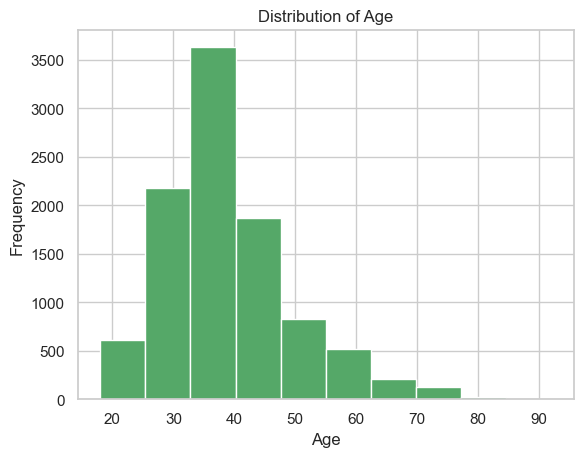

In [133]:
plt.hist(data['age'], facecolor='g' ,bins=10)
plt.xlabel('Age')
plt.ylabel('Frequency')
plt.title('Distribution of Age')
plt.show()

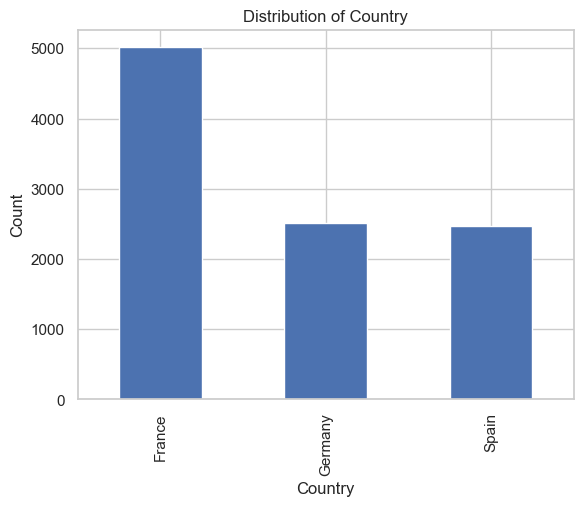

In [134]:
data['country'].value_counts().plot(kind='bar')
plt.xlabel('Country')
plt.ylabel('Count')
plt.title('Distribution of Country')
plt.show()

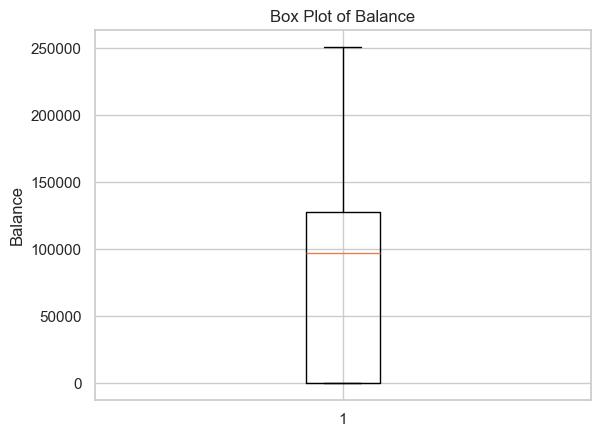

In [135]:
plt.boxplot(data['balance'])
plt.ylabel('Balance')
plt.title('Box Plot of Balance')
plt.show()

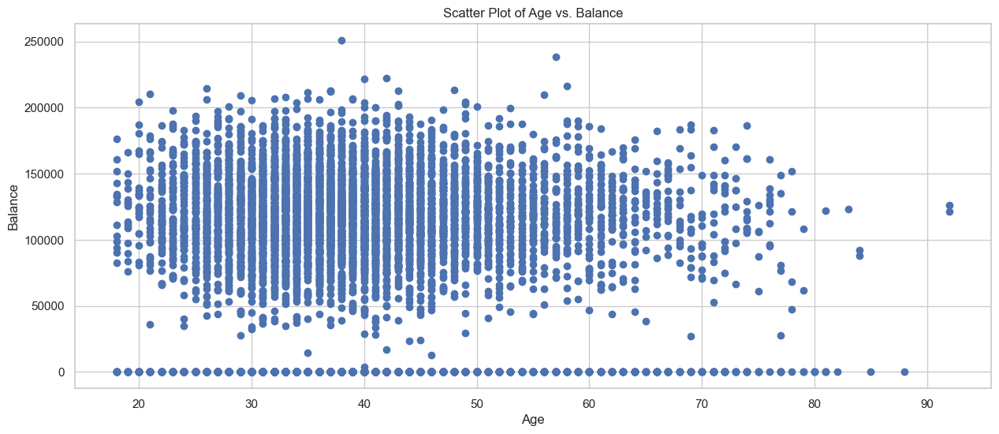

In [136]:
figure = plt.figure(figsize=(15, 6))
plt.scatter(data['age'], data['balance'])
plt.xlabel('Age')
plt.ylabel('Balance')
plt.title('Scatter Plot of Age vs. Balance')
plt.show()

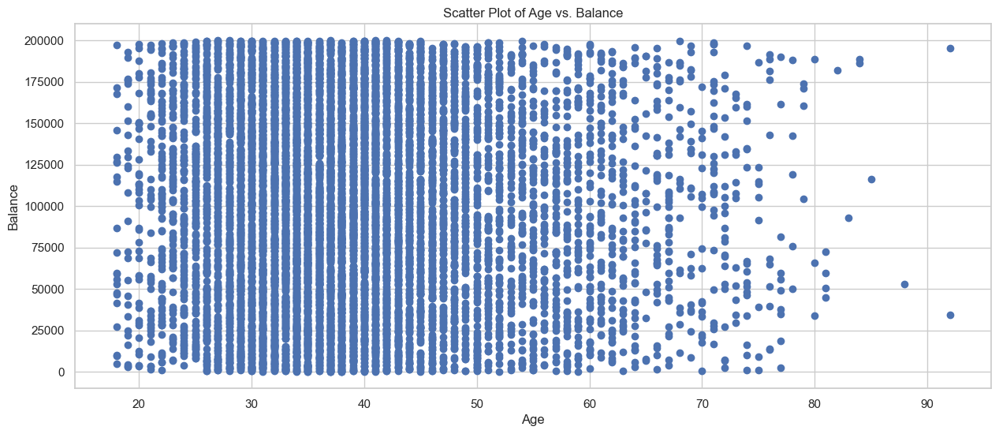

In [137]:
figure = plt.figure(figsize=(15, 6))
plt.scatter(data['age'], data['estimated_salary'])
plt.xlabel('Age')
plt.ylabel('Balance')
plt.title('Scatter Plot of Age vs. Balance')
plt.show()

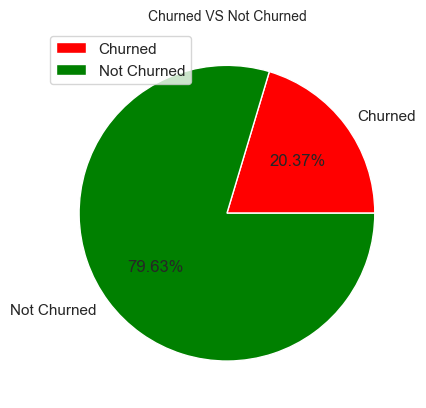

In [138]:
sizes = [data.churn[data['churn']==1].count(), data.churn[data['churn']==0].count()]
labels = ['Churned', 'Not Churned']
colors = ['red', 'Green']

plt.pie(sizes, labels=labels, autopct='%.2f%%', colors=colors)
plt.legend(loc='upper left')
plt.title("Churned VS Not Churned", size=10)
plt.show()

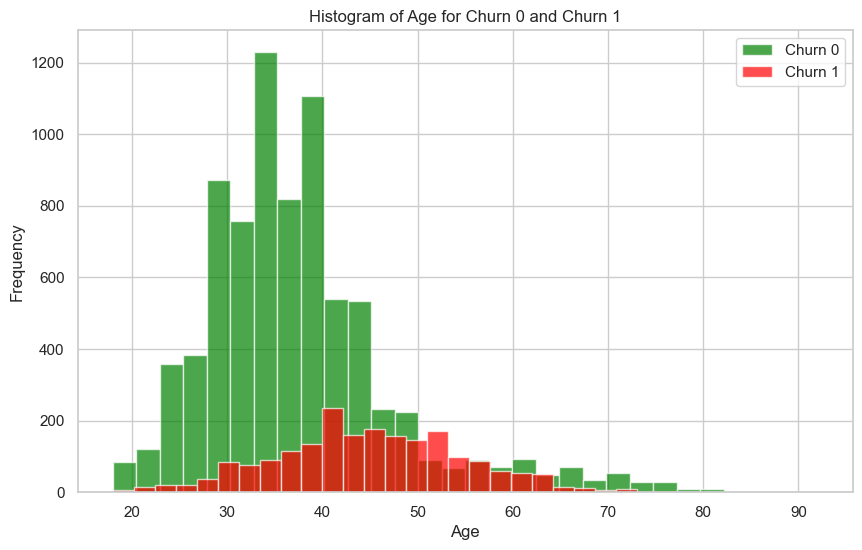

In [139]:
churn_0_age = data[data["churn"] == 0]["age"]
churn_1_age = data[data["churn"] == 1]["age"]
plt.figure(figsize=(10, 6))
plt.hist(churn_0_age, bins=30, alpha=0.7, color="Green", label="Churn 0")
plt.hist(churn_1_age, bins=30, alpha=0.7, color="Red", label="Churn 1")

plt.xlabel("Age")
plt.ylabel("Frequency")
plt.title("Histogram of Age for Churn 0 and Churn 1")
plt.legend()
plt.show()

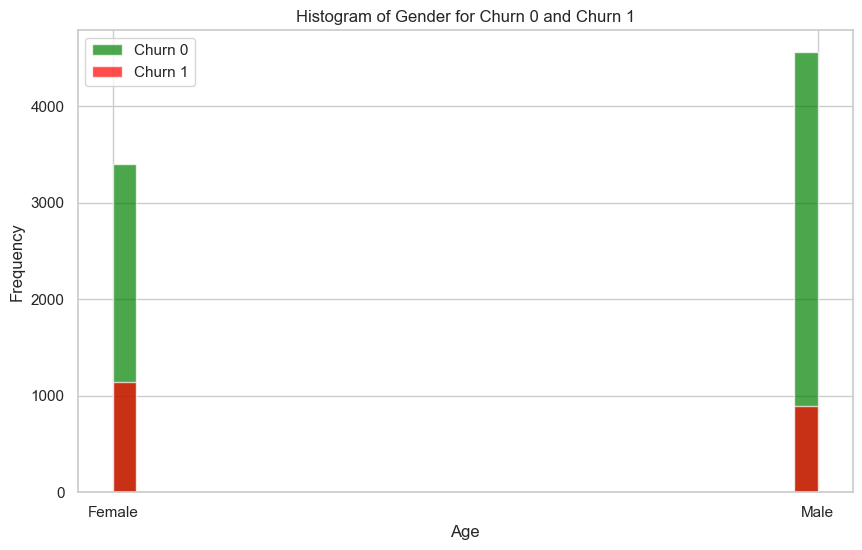

In [140]:
churn_0_age = data[data["churn"] == 0]["gender"]
churn_1_age = data[data["churn"] == 1]["gender"]
plt.figure(figsize=(10, 6))
plt.hist(churn_0_age, bins=30, alpha=0.7, color="Green", label="Churn 0")
plt.hist(churn_1_age, bins=30, alpha=0.7, color="Red", label="Churn 1")

plt.xlabel("Age")
plt.ylabel("Frequency")
plt.title("Histogram of Gender for Churn 0 and Churn 1")
plt.legend()
plt.show()

<Axes: xlabel='credit_card'>

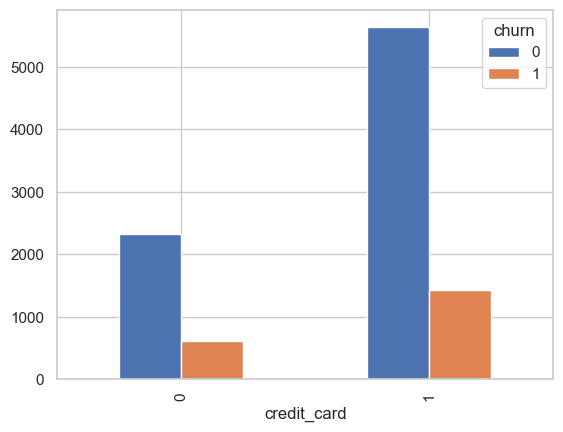

In [141]:
data.groupby(['credit_card', 'churn']).churn.count().unstack().plot(kind='bar')

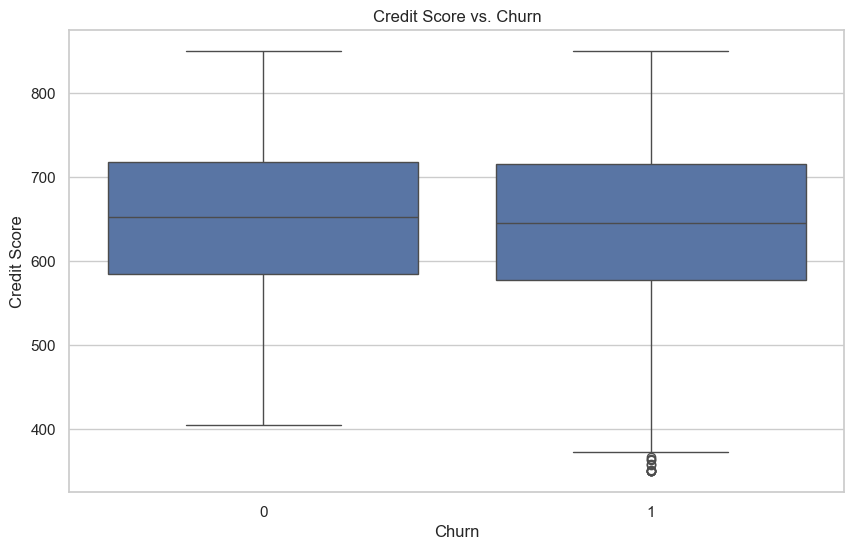

              credit_score     churn
credit_score      1.000000 -0.027094
churn            -0.027094  1.000000


In [142]:
# prompt: Credit Score and Churn
# How does a customer’s credit score relate to their likelihood of churning?

plt.figure(figsize=(10, 6))
sns.boxplot(x='churn', y='credit_score', data=data)
plt.title('Credit Score vs. Churn')
plt.xlabel('Churn')
plt.ylabel('Credit Score')
plt.show()
correlation_matrix = data[['credit_score', 'churn']].corr()
print(correlation_matrix)

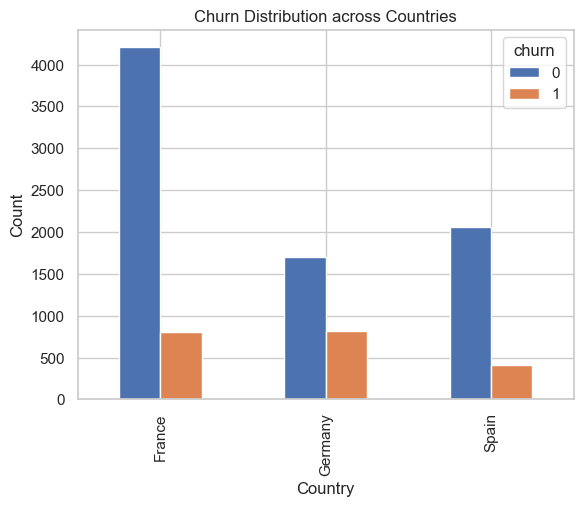

In [143]:
pd.crosstab(data['country'], data['churn']).plot(kind='bar')
plt.xlabel('Country')
plt.ylabel('Count')
plt.title('Churn Distribution across Countries')
plt.show()

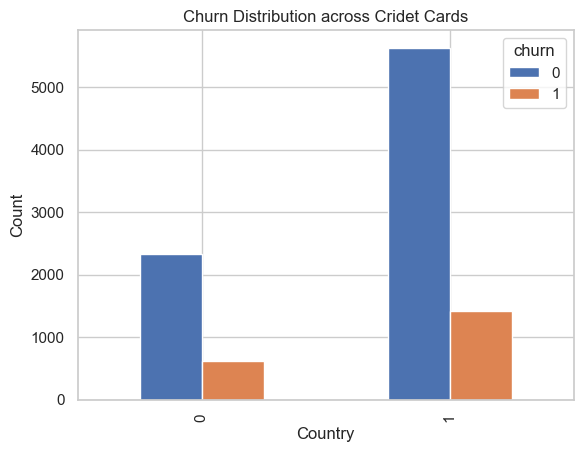

In [144]:
pd.crosstab(data['credit_card'], data['churn']).plot(kind='bar')
plt.xlabel('Country')
plt.ylabel('Count')
plt.title('Churn Distribution across Cridet Cards')
plt.show()

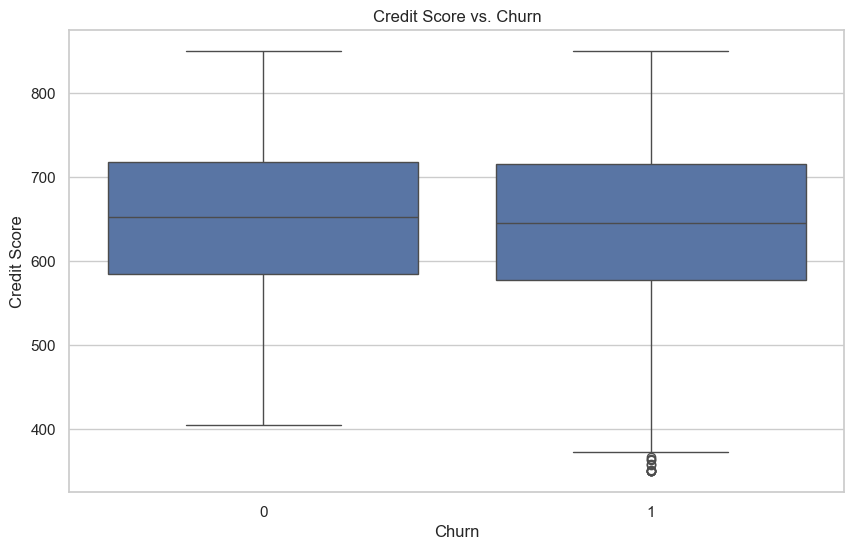

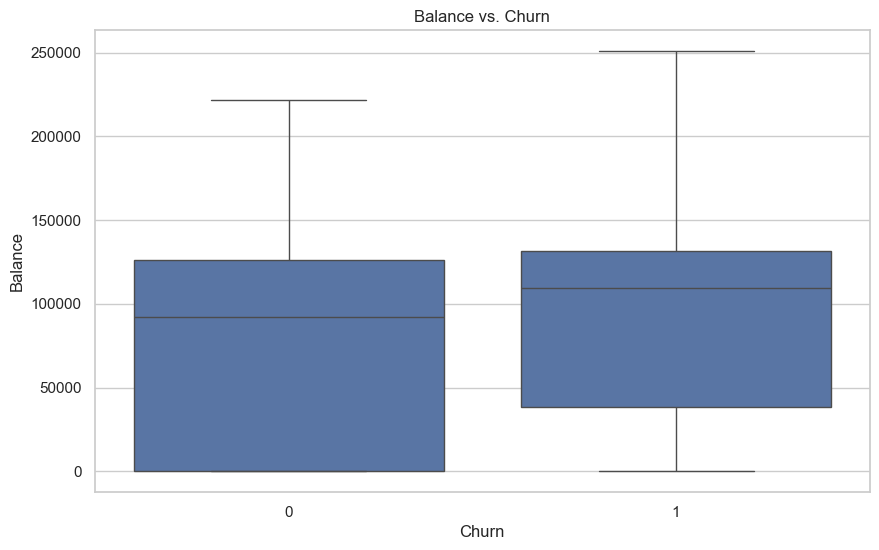

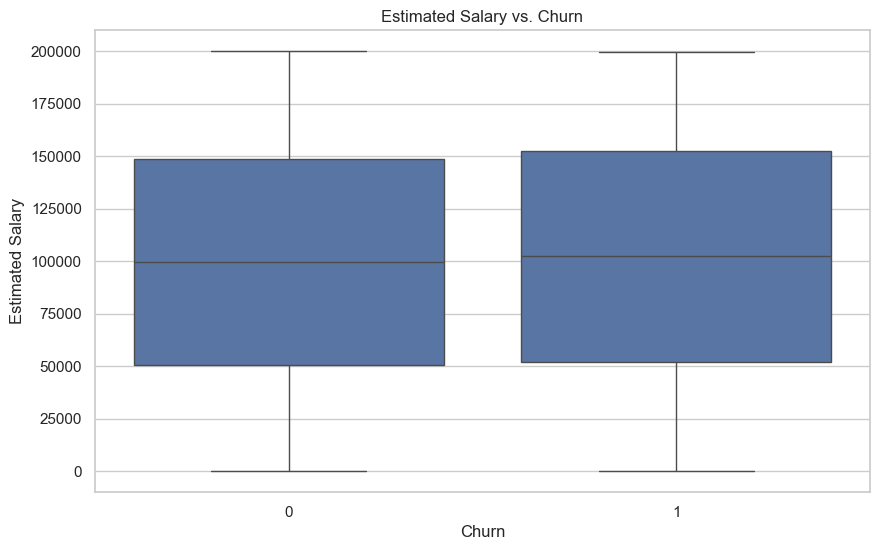

In [145]:
plt.figure(figsize=(10, 6))
sns.boxplot(x='churn', y='credit_score', data=data)
plt.title('Credit Score vs. Churn')
plt.xlabel('Churn')
plt.ylabel('Credit Score')
plt.show()

plt.figure(figsize=(10, 6))
sns.boxplot(x='churn', y='balance', data=data)
plt.title('Balance vs. Churn')
plt.xlabel('Churn')
plt.ylabel('Balance')
plt.show()

plt.figure(figsize=(10, 6))
sns.boxplot(x='churn', y='estimated_salary', data=data)
plt.title('Estimated Salary vs. Churn')
plt.xlabel('Churn')
plt.ylabel('Estimated Salary')
plt.show()

**Analyze distributions of categorical features**

country
France     5014
Germany    2509
Spain      2477
Name: count, dtype: int64


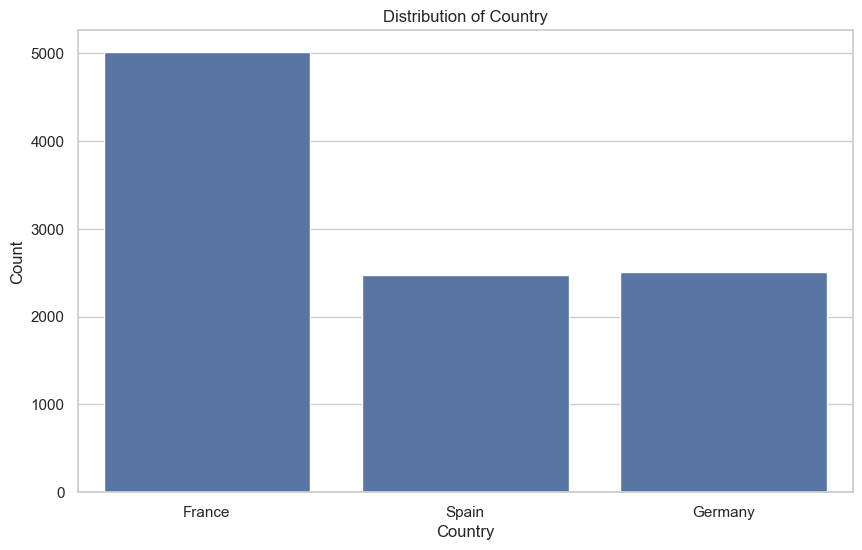

gender
Male      5457
Female    4543
Name: count, dtype: int64


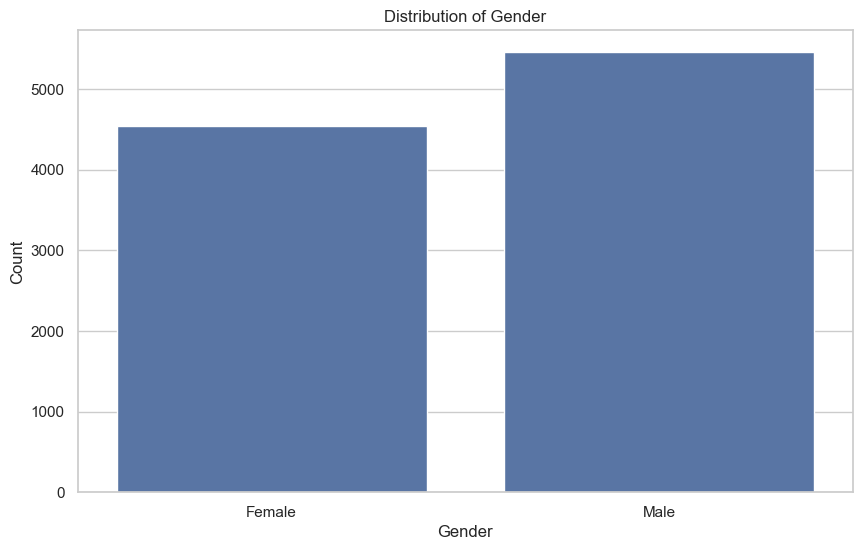

credit_card
1    7055
0    2945
Name: count, dtype: int64


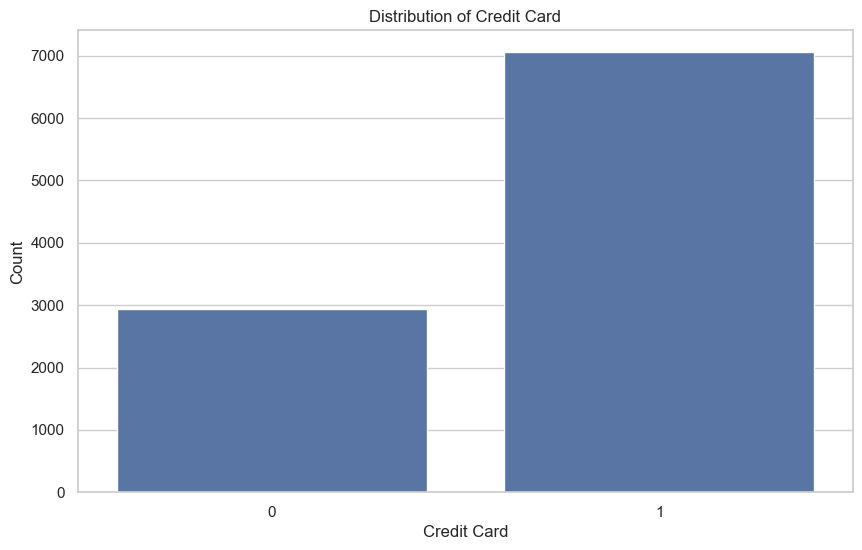

In [146]:
# Country
print(data['country'].value_counts())
plt.figure(figsize=(10, 6))
sns.countplot(x='country', data=data)
plt.title('Distribution of Country')
plt.xlabel('Country')
plt.ylabel('Count')
plt.show()

# Gender
print(data['gender'].value_counts())
plt.figure(figsize=(10, 6))
sns.countplot(x='gender', data=data)
plt.title('Distribution of Gender')
plt.xlabel('Gender')
plt.ylabel('Count')
plt.show()

# Credit Card
print(data['credit_card'].value_counts())
plt.figure(figsize=(10, 6))
sns.countplot(x='credit_card', data=data)
plt.title('Distribution of Credit Card')
plt.xlabel('Credit Card')
plt.ylabel('Count')
plt.show()

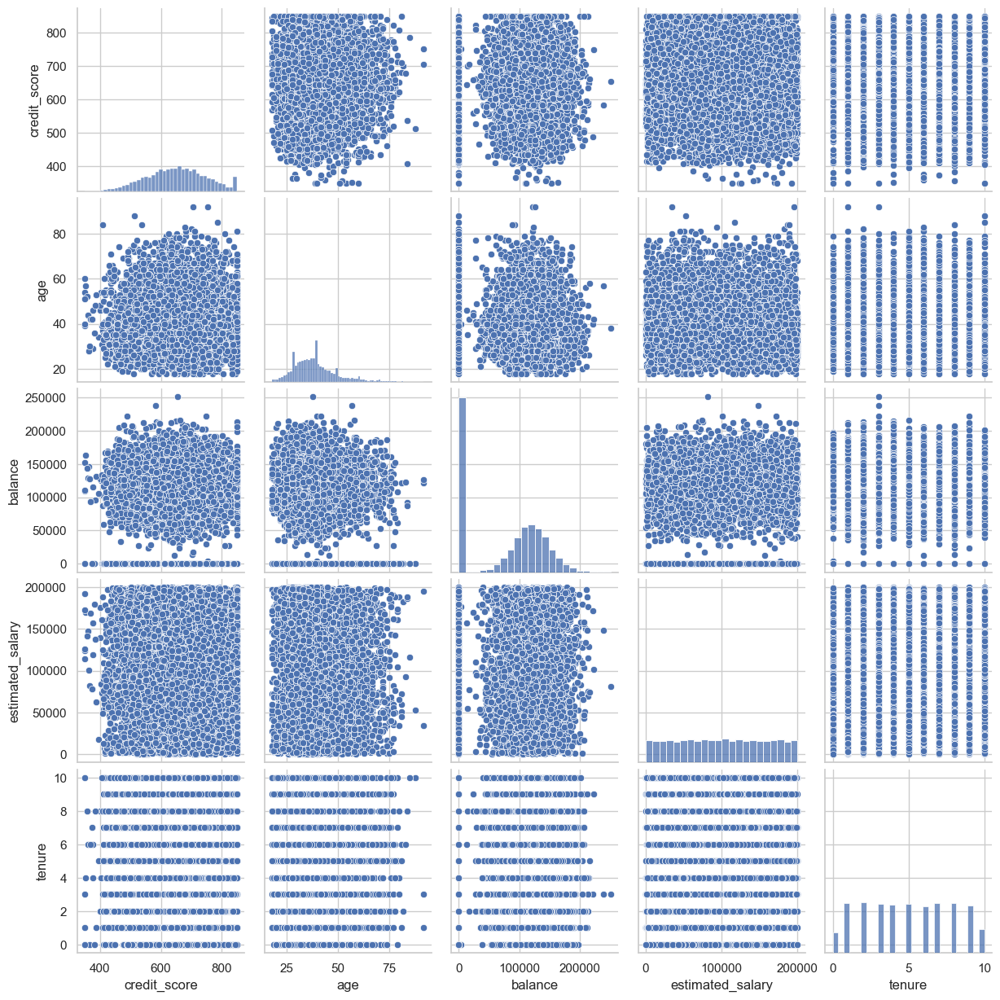

In [147]:
numerical_features = ['credit_score', 'age', 'balance', 'estimated_salary', 'tenure']
sns.pairplot(data[numerical_features])
plt.show()

<Axes: xlabel='products_number'>

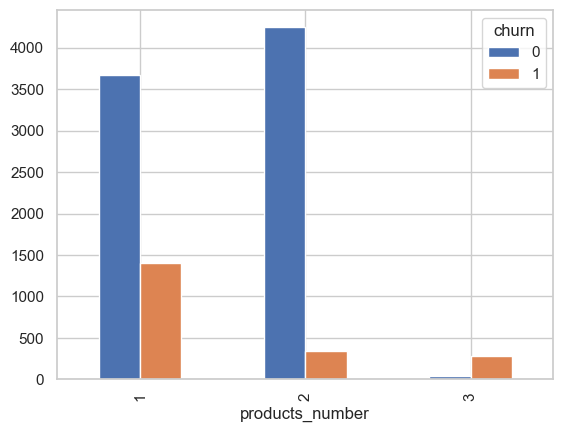

In [148]:
data.groupby(['products_number','churn']).churn.count().unstack().plot(kind='bar')

* ### VISUALIZATION ###

In [149]:
data=pd.read_csv('modified_Bank Customer Churn Prediction.csv')

In [150]:
data.head(10)

,credit_score,country,gender,age,tenure,balance,products_number,credit_card,active_member,estimated_salary,...,age_seg_B,age_seg_C,credit_score_seg,balance_seg,tenure_seg,gender_country,balance_salary_ratio,age_group,balance_credit_ratio,age_seg_A
0,619,France,Female,42,2,0.00,1,1,1,101348.88,...,1,0,2,0,0,Female_France,0.000000,37-55,0.000000,0
1,608,Spain,Female,41,1,83807.86,1,0,1,112542.58,...,1,0,2,1,0,Female_Spain,0.744677,37-55,137.841875,0
2,502,France,Female,42,8,159660.80,3,1,0,113931.57,...,1,0,1,3,3,Female_France,1.401375,37-55,318.049402,0
3,699,France,Female,39,1,0.00,2,0,0,93826.63,...,1,0,5,0,0,Female_France,0.000000,37-55,0.000000,0
4,850,Spain,Female,43,2,125510.82,1,1,1,79084.10,...,1,0,6,2,0,Female_Spain,1.587055,37-55,147.659788,0
5,645,Spain,Male,44,8,113755.78,2,1,0,149756.71,...,1,0,3,2,3,Male_Spain,0.759604,37-55,176.365550,0
6,822,France,Male,50,7,0.00,2,1,1,10062.80,...,1,0,6,0,2,Male_France,0.000000,37-55,0.000000,0
7,376,Germany,Female,29,4,115046.74,3,1,0,119346.88,...,0,0,0,2,1,Female_Germany,0.963969,17-36,305.975372,1
8,501,France,Male,44,4,142051.07,2,0,1,74940.50,...,1,0,1,3,1,Male_France,1.895518,37-55,283.535070,0
9,684,France,Male,27,2,134603.88,1,1,1,71725.73,...,0,0,4,3,0,Male_France,1.876647,17-36,196.789298,1


In [151]:
data.head(10)


,credit_score,country,gender,age,tenure,balance,products_number,credit_card,active_member,estimated_salary,...,age_seg_B,age_seg_C,credit_score_seg,balance_seg,tenure_seg,gender_country,balance_salary_ratio,age_group,balance_credit_ratio,age_seg_A
0,619,France,Female,42,2,0.00,1,1,1,101348.88,...,1,0,2,0,0,Female_France,0.000000,37-55,0.000000,0
1,608,Spain,Female,41,1,83807.86,1,0,1,112542.58,...,1,0,2,1,0,Female_Spain,0.744677,37-55,137.841875,0
2,502,France,Female,42,8,159660.80,3,1,0,113931.57,...,1,0,1,3,3,Female_France,1.401375,37-55,318.049402,0
3,699,France,Female,39,1,0.00,2,0,0,93826.63,...,1,0,5,0,0,Female_France,0.000000,37-55,0.000000,0
4,850,Spain,Female,43,2,125510.82,1,1,1,79084.10,...,1,0,6,2,0,Female_Spain,1.587055,37-55,147.659788,0
5,645,Spain,Male,44,8,113755.78,2,1,0,149756.71,...,1,0,3,2,3,Male_Spain,0.759604,37-55,176.365550,0
6,822,France,Male,50,7,0.00,2,1,1,10062.80,...,1,0,6,0,2,Male_France,0.000000,37-55,0.000000,0
7,376,Germany,Female,29,4,115046.74,3,1,0,119346.88,...,0,0,0,2,1,Female_Germany,0.963969,17-36,305.975372,1
8,501,France,Male,44,4,142051.07,2,0,1,74940.50,...,1,0,1,3,1,Male_France,1.895518,37-55,283.535070,0
9,684,France,Male,27,2,134603.88,1,1,1,71725.73,...,0,0,4,3,0,Male_France,1.876647,17-36,196.789298,1


In [152]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 25 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   credit_score          10000 non-null  int64  
 1   country               10000 non-null  object 
 2   gender                10000 non-null  object 
 3   age                   10000 non-null  int64  
 4   tenure                10000 non-null  int64  
 5   balance               10000 non-null  float64
 6   products_number       10000 non-null  int64  
 7   credit_card           10000 non-null  int64  
 8   active_member         10000 non-null  int64  
 9   estimated_salary      10000 non-null  float64
 10  churn                 10000 non-null  int64  
 11  gender_num            10000 non-null  int64  
 12  country_Germany       10000 non-null  int64  
 13  country_Spain         10000 non-null  int64  
 14  gender_Male           10000 non-null  int64  
 15  age_seg_B           

<Axes: xlabel='products_number'>

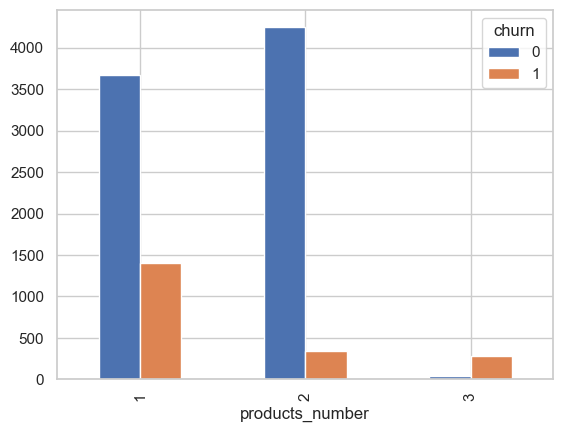

In [153]:
data.groupby(['products_number','churn']).churn.count().unstack().plot(kind='bar')

-> What are the countries in this data?

In [154]:
data.country.unique()

array(['France', 'Spain', 'Germany'], dtype=object)

-> The map of countries

In [155]:
import folium

# Create a map centered over Europe
m = folium.Map(location=[50, 10], zoom_start=4)  # Latitude and longitude are for central Europe

# Add markers for France, Spain, and Germany
folium.Marker([46.603354, 1.888334], popup='France').add_to(m)
folium.Marker([40.463667, -3.74922], popup='Spain').add_to(m)
folium.Marker([51.165691, 10.451526], popup='Germany').add_to(m)

m.save("europe_map.html")
m


-> shows the relationships (correlations)between different numerical variables in your dataset

In [156]:
features = ['churn', 'credit_score', 'country_Germany', 'country_Spain',
            'gender_Male', 'age', 'tenure', 'balance', 'products_number', 
            'credit_card', 'active_member', 'estimated_salary',
            'age_seg_A', 'age_seg_B', 'age_seg_C',
            'balance_salary_ratio', 'balance_credit_ratio']

correlation_matrix = data[features].corr()

fig = px.imshow(correlation_matrix, 
                color_continuous_scale='RdBu', 
                title='Correlation Matrix',
                labels=dict(x="Features", y="Features", color="Correlation"),
                x=correlation_matrix.columns,
                y=correlation_matrix.columns)

fig.update_layout(
    width=800,
    height=600,
    xaxis=dict(tickangle=-45),
    yaxis=dict(tickangle=0)
)

fig.show()


ValueError: Mime type rendering requires nbformat>=4.2.0 but it is not installed

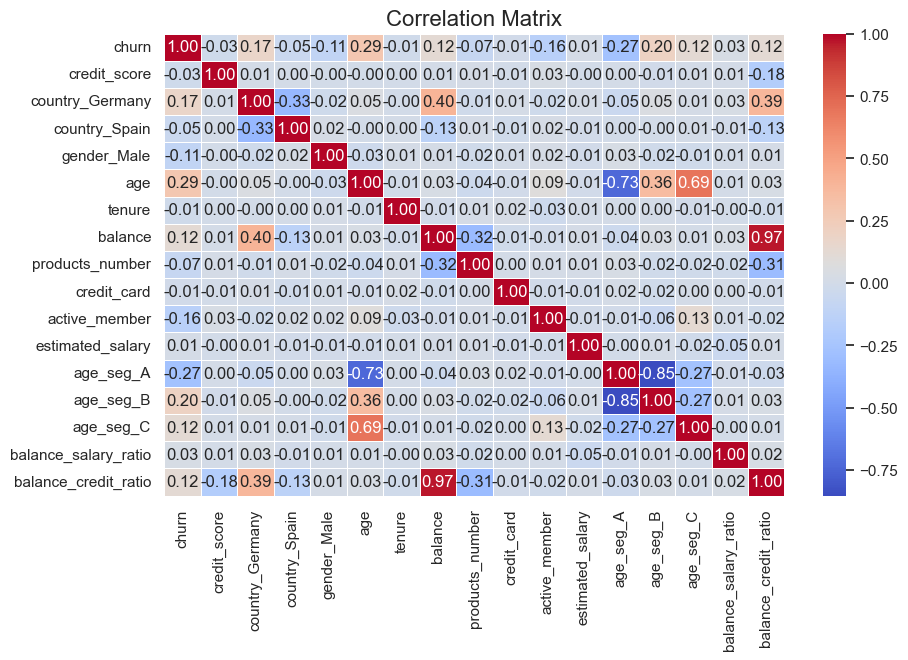

In [102]:
correlation_matrix = data[['churn', 'credit_score', 'country_Germany', 'country_Spain',
            'gender_Male', 'age', 'tenure', 'balance', 'products_number', 
            'credit_card', 'active_member', 'estimated_salary',
            'age_seg_A', 'age_seg_B', 'age_seg_C',
            'balance_salary_ratio', 'balance_credit_ratio']].corr()

sns.set(style="whitegrid")

plt.figure(figsize=(10, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5, cbar=True)
plt.title('Correlation Matrix', fontsize=16)

plt.show()

-> the percentage of Churn and Non-Churn

In [19]:
import plotly.express as px
import pandas as pd

product_counts = data['churn'].value_counts()
label_mapping = {0: 'Non-churn', 1: 'Churn'}

product_counts.index = product_counts.index.map(label_mapping)

# Create pie chart
fig = px.pie(
    names=product_counts.index,
    values=product_counts.values,
    title='Churn Status for Customers'
)

# Update trace to enhance the visual presentation
fig.update_traces(
    hoverinfo='label+percent+value',
    textinfo='percent',
    textfont_size=16,
    marker=dict(
        line=dict(color='#FFFFFF', width=2)
    )
)
fig.show()


-> Gender and churn


In [30]:
churned_data = data[data['churn'] == 1]

gender_counts = churned_data['gender'].value_counts()

gender_percentages = gender_counts.reset_index()
gender_percentages.columns = ['gender', 'count']

gender_percentages['percentage'] = (gender_percentages['count'] / gender_percentages['count'].sum() * 100).round(2)

# Step 4: Create the pie chart
fig = px.pie(
    gender_percentages,
    names='gender',                # Use gender for names
    values='percentage',           # Percentage values
    title='Churn Percentage by Gender',
    color='gender',               # Color by gender
    labels={'percentage': 'Percentage'},
    color_discrete_map={
        'Male': 'skyblue',        # Set color for Male
        'Female': 'lightpink'     # Set color for Female
    }
)

fig.update_layout(
    title_text='Percentage of Churn by Gender',
    legend_title_text='Gender',
)

fig.update_traces(
    hoverinfo='label+percent+value',
    textinfo='percent',
    textfont_size=16,
    marker=dict(
        line=dict(color='#FFFFFF', width=2)
    )
)
fig.show()

-> As we can see in the pie chart above, the percentage of the total number of 'Female' is bigger than the percentage of the total number of 'Male'

. that means 'Female' is more likely to be churned

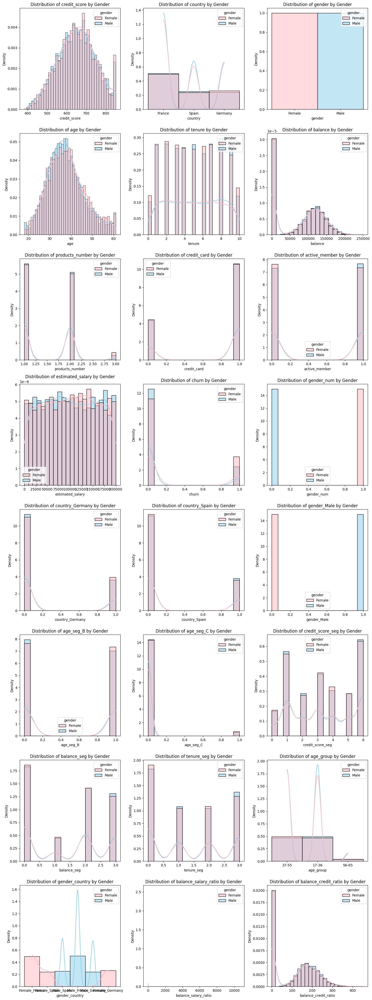

In [7]:
data['gender'] = data['gender_Male'].apply(lambda x: 'Male' if x == 1 else 'Female')

num_columns = len(data.columns) - 1  # Exclude the target variable if applicable
rows = (num_columns // 3) + (num_columns % 3 > 0)  # Calculate rows needed for 3 columns

fig, axs = plt.subplots(nrows=rows, ncols=3, figsize=(15, 5 * rows))
axs = axs.flat

# Loop through each feature and create a histogram
for i, column in enumerate(data.columns[:-1]):  # Exclude the target variable
    sns.histplot(
        data=data, 
        x=column, 
        hue="gender", 
        ax=axs[i], 
        kde=True, 
        stat="density", 
        common_norm=False,
        palette={'Male': 'skyblue', 'Female': 'lightpink'}  # Set custom colors for gender
    )
    axs[i].set_title(f'Distribution of {column} by Gender')

# Remove any empty subplots
for j in range(i + 1, len(axs)):
    fig.delaxes(axs[j])

# Adjust layout
plt.tight_layout()
plt.show()


The graphs above show that males have a preference for females in many areas.

* AS WE CAN SHOW ABOVE IN GRAPH AGE BY GENDER MALE'S RANGE FROM 30 T0 40 IS GRATER THAN FEMALE 
    * ONE : NON-CHURN GENDER FROM 30 T0 40

In [11]:
import plotly.express as px

# Filter data for churn = 0 and age between 30 and 40
filtered_data = data[(data['churn'] == 0) & (data['age'].between(30, 40))]

# Count the gender distribution
gender_counts = filtered_data['gender'].value_counts().reset_index()
gender_counts.columns = ['gender', 'count']

# Create a pie chart
fig = px.pie(gender_counts, values='count', names='gender', 
             title='Gender Distribution for Churn = 0 (Age 30-40)',
             color_discrete_map={
                     'Male': 'skyblue',        # Set color for Male
                    'Female': 'lightpink'})

# Show the pie chart
fig.show()


* THE PERSENTAGE OF MALE IS GREATER THAN FEMALE 

-> TWO : CREDIT SCORE FOR NON-CHURN CUSTOMER BY GENDER

In [138]:
import plotly.express as px

# Filter data for non-churn customers
filtered_data = data[(data['churn'] == 0) & (data['age'].between(30, 40))]

# Create a scatter plot with Plotly
fig = px.scatter(
    filtered_data, 
    x='credit_score', 
    y='balance', 
    color='gender', 
    color_discrete_map={'Male': 'skyblue', 'Female': 'lightpink'},
    title='Credit Score vs Balance (Non-Churn) by Gender'
)

# Show the plot
fig.show()


In [17]:
import plotly.express as px

filtered_data = data[(data['churn'] == 0) & (data['age'].between(30, 40))]

fig = px.histogram(
    filtered_data,
    x='credit_score',
    y='balance',
    color='gender',
    color_discrete_map={'Male': 'skyblue', 'Female': 'lightpink'},
    barmode='overlay',
    title='Credit Score vs Balance (Non-Churn) by Gender'
)

fig.update_layout(
    xaxis_title="Credit Score",
    yaxis_title="Balance",
    legend_title="Gender"
)

# Show the plot
fig.show()


* AS WE CAN SEE ABOVE MALE CREDIT SCORE FOR MALE IS GREATER THEN FEMALE IN THIS AGE REANGE

-> THREE : ESTEMATID SALARY AND BALANCE FOR NON-CHURN BY GENDER

In [139]:
import plotly.express as px

# Filter data for non-churn customers
filtered_data = data[(data['churn'] == 0)&(data['age'].between(30,40))]

# Create a scatter plot with Plotly
fig = px.scatter(
    filtered_data, 
    x='estimated_salary', 
    y='balance', 
    color='gender', 
    color_discrete_map={'Male': 'skyblue', 'Female': 'lightpink'},
    title='Estimated Salary vs Balance (Non-Churn) by Gender'
)

# Show the plot
fig.show()


In [21]:
import plotly.express as px

# Filter data for non-churn customers
filtered_data = data[data['churn'] == 0]

# Create a 2D histogram plot for estimated_salary and balance, differentiated by gender
fig = px.histogram(
    filtered_data, 
    x='estimated_salary', 
    y='balance',
    barmode='overlay', 
    color='gender', 
    color_discrete_map={'Male': 'skyblue', 'Female': 'lightpink'},
    nbins=20,  # Adjust the number of bins as needed
    title='Estimated Salary vs Balance (Non-Churn) by Gender',
)

# Show the plot
fig.show()


-> FOUR : ESTIMATED SALARY AND COUNTRY IN THIS RANGE FOR NON-CHURN BY GENDER

In [23]:
import plotly.express as px

# Filter data for non-churn customers aged between 30 and 40
filtered_data = data[(data['churn'] == 0) & (data['age'].between(30, 40))]

# Create a box plot for estimated_salary by country with gender differentiation
fig = px.box(
    filtered_data,
    x='country',
    y='estimated_salary',
    color='gender',
    color_discrete_map={'Male': 'skyblue', 'Female': 'lightpink'},
    title='Estimated Salary by Country (Aged 30-40, Non-Churn)',
    labels={'estimated_salary': 'Estimated Salary', 'country': 'Country'}
)

# Update layout for better visualization
fig.update_layout(
    xaxis_title='Country',
    yaxis_title='Estimated Salary',
    legend_title='Gender',
    boxmode='group'  # Group box plots by gender
)

# Show the plot
fig.show()


In [24]:
import plotly.express as px

# Filter data for non-churn customers aged between 30 and 40
filtered_data = data[(data['churn'] == 0) & (data['age'].between(30, 40))]

# Calculate the average estimated salary by country and gender
average_salary = filtered_data.groupby(['country', 'gender'])['estimated_salary'].mean().reset_index()

# Create a bar chart for average estimated salary by country with gender differentiation
fig = px.bar(
    average_salary,
    x='country',
    y='estimated_salary',
    color='gender',
    color_discrete_map={'Male': 'skyblue', 'Female': 'lightpink'},
    title='Average Estimated Salary by Country (Aged 30-40, Non-Churn)',
    labels={'estimated_salary': 'Average Estimated Salary', 'country': 'Country'},
    barmode='group'  # Group bars by gender
)

# Update layout for better visualization
fig.update_layout(
    xaxis_title='Country',
    yaxis_title='Average Estimated Salary',
    legend_title='Gender'
)

# Show the plot
fig.show()


In [25]:
import plotly.express as px

# Filter data for non-churn customers aged between 30 and 40
filtered_data = data[(data['churn'] == 0) & (data['age'].between(30, 40))]

# Calculate the average estimated salary by country and gender
average_salary = filtered_data.groupby(['country', 'gender'])['balance'].mean().reset_index()

# Create a bar chart for average estimated salary by country with gender differentiation
fig = px.bar(
    average_salary,
    x='country',
    y='balance',
    color='gender',
    color_discrete_map={'Male': 'skyblue', 'Female': 'lightpink'},
    title='Average balance by Country (Aged 30-40, Non-Churn)',
    labels={'balance': 'Average balance', 'country': 'Country'},
    barmode='group'  # Group bars by gender
)

# Update layout for better visualization
fig.update_layout(
    xaxis_title='Country',
    yaxis_title='Average balance',
    legend_title='Gender'
)

# Show the plot
fig.show()


In [26]:
import plotly.express as px

# Filter data for non-churn customers aged between 30 and 40
filtered_data = data[(data['churn'] == 0) & (data['age'].between(30, 40))]

# Calculate the average estimated salary by country and gender
average_salary = filtered_data.groupby(['active_member', 'gender'])['balance'].mean().reset_index()

# Create a bar chart for average estimated salary by country with gender differentiation
fig = px.bar(
    average_salary,
    x='active_member',
    y='balance',
    color='gender',
    color_discrete_map={'Male': 'skyblue', 'Female': 'lightpink'},
    title='Average balance by Country (Aged 30-40, Non-Churn)',
    labels={'balance': 'active members', 'active_member': 'Country'},
    barmode='group'
)

# Update layout for better visualization
fig.update_layout(
    xaxis_title='active_member',
    yaxis_title='Average balance',
    legend_title='Gender'
)

fig.show()


* TWO GRAPHS SHOW AS THAT THE FFEMALES BUY MORE EXPENSIVE THINGS THAN MEN

In [9]:
import plotly.express as px
import plotly.subplots as sp
import plotly.graph_objects as go

data['gender'] = data['gender_Male'].apply(lambda x: 'Male' if x == 1 else 'Female')

num_columns = len(data.columns) - 1  # Exclude the target variable if applicable
rows = (num_columns // 3) + (num_columns % 3 > 0)  # Calculate rows needed for 3 columns

# Create a subplot grid
fig = sp.make_subplots(rows=rows, cols=3, subplot_titles=data.columns[:-1])

# Loop through each feature and create a histogram
for i, column in enumerate(data.columns[:-1]):  # Exclude the target variable
    row = (i // 3) + 1
    col = (i % 3) + 1

    # Create histogram using plotly express
    hist_fig = px.histogram(
        data_frame=data,
        x=column,
        color="gender",
        color_discrete_map={'Male': 'skyblue', 'Female': 'lightpink'},
        histnorm='density',
        barmode='overlay'
    )
    
    # Add traces to the subplot
    for trace in hist_fig['data']:
        fig.add_trace(trace, row=row, col=col)

# Update the overall layout
fig.update_layout(
    height=rows * 300,  # Adjust height based on the number of rows
    width=900,
    title_text="Distributions of Features by Gender",
    showlegend=True
)

# Show the plot
fig.show()


-> Age with churn


In [27]:
churned_data = data[data['churn'] == 1]

gender_counts = churned_data['age_group'].value_counts()

gender_percentages = gender_counts.reset_index()
gender_percentages.columns = ['age_group', 'count']

gender_percentages['percentage'] = (gender_percentages['count'] / gender_percentages['count'].sum() * 100).round(2)

# Step 4: Create the pie chart
fig = px.pie(
    gender_percentages,
    names='age_group',                
    values='percentage',           
    title='Churn Percentage by Gender',
    labels={'percentage': 'Percentage'},
    color_discrete_map={
        'Male': 'skyblue',
        'Female': 'lightpink'     # Set color for Female
    }
)

fig.update_layout(
    title_text='Percentage of Churned Coustomers by Age Groups',
    legend_title_text='Age Groups',
)

fig.update_traces(
    hoverinfo='label+percent+value',
    textinfo='percent',
    textfont_size=16,
    marker=dict(
        line=dict(color='#FFFFFF', width=2)
    )
)
fig.show()

* As we can see the percentage of the age grops from 37 to 55 years old is the biggest 

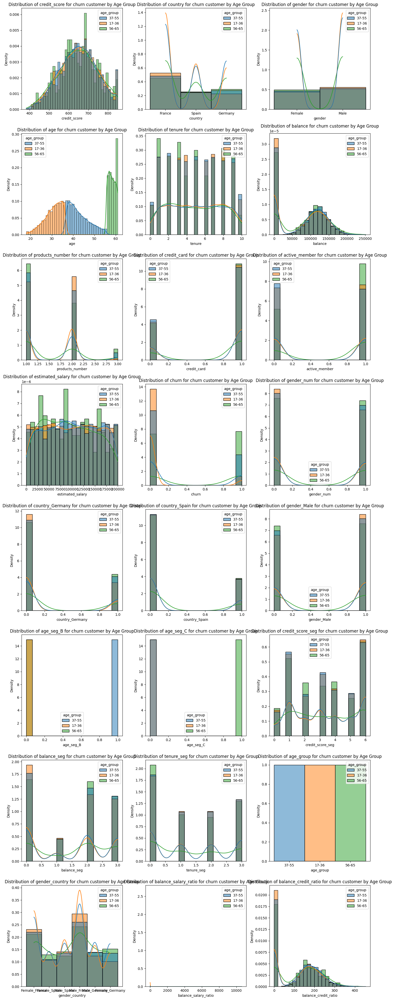

In [33]:
churn_data = data[data['churn']==1]
num_columns = len(data.columns) - 1
rows = (num_columns // 3) + (num_columns % 3 > 0)
fig, axs = plt.subplots(nrows=rows, ncols=3, figsize=(15, 5 * rows))
axs = axs.flat
for i, column in enumerate(churn_data.columns[:-1]):
    sns.histplot(data=data, x=column, hue="age_group", ax=axs[i], kde=True, stat="density", common_norm=False)
    axs[i].set_title(f'Distribution of {column} for churn customer by Age Group')

for j in range(i + 1, len(axs)):
    fig.delaxes(axs[j])

plt.tight_layout()
plt.show()

-> Balance and churn


In [66]:
import numpy as np
import pandas as pd
import plotly.graph_objects as go

# Define bins and labels for balance segmentation
bins = [-1, 50000, 90000, 127000, np.inf]
labels = ['0-50k', '50k-90k', '90k-127k', '127k+']

# Create a new column for balance segmentation
data['balance_seg'] = pd.cut(data['balance'], bins=bins, labels=labels, right=False)

# Filter for churned customers
churned_data = data[data['churn'] == 1]

# Count occurrences in each balance segment
balance_churn_counts = churned_data['balance_seg'].value_counts().reset_index()
balance_churn_counts.columns = ['balance_seg', 'count']

# Create a pie chart for the balance segments of churned customers
fig = go.Figure()

fig.add_trace(go.Pie(
    labels=balance_churn_counts['balance_seg'],
    values=balance_churn_counts['count'],
    textinfo='label+percent',  # Show both label and percentage
    hole=0.4,  # Makes it a donut chart
    marker=dict(line=dict(color='#FFFFFF', width=2))  # Adds border to the pie sections
))

# Update layout for better readability
fig.update_layout(
    title='Churned Customers Distribution by Balance Segmentation',
    height=600,
    margin=dict(l=40, r=40, t=40, b=40)  # Set margins for all sides
)

# Show the plot
fig.show()


* As we can see in the pie chart above, that the customer with the balance from 50k to 90k is likely to be churned 

In [107]:
import plotly.express as px
import pandas as pd

data['balance_seg'] = pd.cut(data['balance'], bins=[-1, 50000, 90000, 127000, np.inf],
                             labels=['0-50K', '50K-90K', '90K-127K', '127K+'])

balance_churn = data.groupby(['balance_seg', 'churn']).size().unstack(fill_value=0)

fig = px.bar(
    balance_churn.reset_index(), 
    x='balance_seg', 
    y=[0, 1],
    labels={'balance_seg': 'Balance Range', 'value': 'Count', 'variable': 'Churn Status'},
    title='Churn vs Non-Churn by Balance Range',
    color_discrete_map={0: 'deepskyblue', 1: 'tomato'}
)

fig.update_layout(
    xaxis_title='Balance Range',
    yaxis_title='Count',
    legend_title='Churn Status',
    barmode='group'
)

fig.show()


C:\Users\DELL\AppData\Local\Temp\ipykernel_23560\1407816516.py:7: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



-> Customer Churn Analysis for Balance between 0 to 50k

In [81]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

filtered_data = data[data['balance'].between(0,50000)]

fig = make_subplots(
    rows=3, cols=2,
    subplot_titles=('Age Distribution by Churn', 'Balance Distribution by Churn',
                   'Churn Count by Gender', 'Estimated Salary Distribution by Churn',
                   'Churn Count by Tenure', 'Churn Count by Country'),
    specs=[[{'type': 'histogram'}, {'type': 'histogram'}],
           [{'type': 'bar'}, {'type': 'histogram'}],
           [{'type': 'bar'}, {'type': 'bar'}]]
)

fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 0]['age'], 
                 name='Non-Churn', marker_color='deepskyblue', opacity=0.6),
    row=1, col=1
)
fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 1]['age'], 
                 name='Churn', marker_color='tomato', opacity=0.6),
    row=1, col=1
)

fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 0]['credit_score'], 
                 name='Non-Churn', marker_color='lightgreen', opacity=0.6),
    row=1, col=2
)
fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 1]['credit_score'], 
                 name='Churn', marker_color='orange', opacity=0.6),
    row=1, col=2
)

gender_churn_counts = filtered_data.groupby('gender')['churn'].value_counts().unstack(fill_value=0)
fig.add_trace(
    go.Bar(x=gender_churn_counts.index, 
           y=gender_churn_counts[0], 
           name='Non-Churn', 
           marker_color='deepskyblue'),
    row=2, col=1
)
fig.add_trace(
    go.Bar(x=gender_churn_counts.index, 
           y=gender_churn_counts[1], 
           name='Churn', 
           marker_color='tomato'),
    row=2, col=1
)

fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 0]['estimated_salary'], 
                 name='Non-Churn', marker_color='lightcoral', opacity=0.6),
    row=2, col=2
)
fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 1]['estimated_salary'], 
                 name='Churn', marker_color='gold', opacity=0.6),
    row=2, col=2
)

tenure_churn_counts = filtered_data.groupby('tenure')['churn'].value_counts().unstack(fill_value=0)
fig.add_trace(
    go.Bar(x=tenure_churn_counts.index, 
           y=tenure_churn_counts[0], 
           name='Non-Churn', 
           marker_color='deepskyblue'),
    row=3, col=1
)
fig.add_trace(
    go.Bar(x=tenure_churn_counts.index, 
           y=tenure_churn_counts[1], 
           name='Churn', 
           marker_color='tomato'),
    row=3, col=1
)

country_churn_counts = filtered_data.groupby('country')['churn'].value_counts().unstack(fill_value=0)
fig.add_trace(
    go.Bar(x=country_churn_counts.index, 
           y=country_churn_counts[0], 
           name='Non-Churn', 
           marker_color='lightgreen'),
    row=3, col=2
)
fig.add_trace(
    go.Bar(x=country_churn_counts.index, 
           y=country_churn_counts[1], 
           name='Churn', 
           marker_color='orange'),
    row=3, col=2
)

fig.update_layout(
    title_text='Customer Churn Analysis for Balance between 0 to 50k',
    barmode='overlay',  
    showlegend=True,
    height=800,  
    width=1000,
    margin=dict(l=40, r=40, t=40, b=40)
)

fig.show()



-> Customer Churn Analysis for Balance between 0 to 50k

In [85]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

filtered_data = data[data['balance'].between(50001,90000)]

fig = make_subplots(
    rows=3, cols=2,
    subplot_titles=('Age Distribution by Churn', 'Balance Distribution by Churn',
                   'Churn Count by Gender', 'Estimated Salary Distribution by Churn',
                   'Churn Count by Tenure', 'Churn Count by Country'),
    specs=[[{'type': 'histogram'}, {'type': 'histogram'}],
           [{'type': 'bar'}, {'type': 'histogram'}],
           [{'type': 'bar'}, {'type': 'bar'}]]
)

fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 0]['age'], 
                 name='Non-Churn', marker_color='deepskyblue', opacity=0.6),
    row=1, col=1
)
fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 1]['age'], 
                 name='Churn', marker_color='tomato', opacity=0.6),
    row=1, col=1
)

fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 0]['credit_score'], 
                 name='Non-Churn', marker_color='lightgreen', opacity=0.6),
    row=1, col=2
)
fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 1]['credit_score'], 
                 name='Churn', marker_color='orange', opacity=0.6),
    row=1, col=2
)

gender_churn_counts = filtered_data.groupby('gender')['churn'].value_counts().unstack(fill_value=0)
fig.add_trace(
    go.Bar(x=gender_churn_counts.index, 
           y=gender_churn_counts[0], 
           name='Non-Churn', 
           marker_color='deepskyblue'),
    row=2, col=1
)
fig.add_trace(
    go.Bar(x=gender_churn_counts.index, 
           y=gender_churn_counts[1], 
           name='Churn', 
           marker_color='tomato'),
    row=2, col=1
)

fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 0]['estimated_salary'], 
                 name='Non-Churn', marker_color='lightcoral', opacity=0.6),
    row=2, col=2
)
fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 1]['estimated_salary'], 
                 name='Churn', marker_color='gold', opacity=0.6),
    row=2, col=2
)

tenure_churn_counts = filtered_data.groupby('tenure')['churn'].value_counts().unstack(fill_value=0)
fig.add_trace(
    go.Bar(x=tenure_churn_counts.index, 
           y=tenure_churn_counts[0], 
           name='Non-Churn', 
           marker_color='deepskyblue'),
    row=3, col=1
)
fig.add_trace(
    go.Bar(x=tenure_churn_counts.index, 
           y=tenure_churn_counts[1], 
           name='Churn', 
           marker_color='tomato'),
    row=3, col=1
)

country_churn_counts = filtered_data.groupby('country')['churn'].value_counts().unstack(fill_value=0)
fig.add_trace(
    go.Bar(x=country_churn_counts.index, 
           y=country_churn_counts[0], 
           name='Non-Churn', 
           marker_color='lightgreen'),
    row=3, col=2
)
fig.add_trace(
    go.Bar(x=country_churn_counts.index, 
           y=country_churn_counts[1], 
           name='Churn', 
           marker_color='orange'),
    row=3, col=2
)

fig.update_layout(
    title_text='Customer Churn Analysis for Balance between 50k to 90k',
    barmode='overlay',  
    showlegend=True,
    height=800,  
    width=1000,
    margin=dict(l=40, r=40, t=40, b=40)
)

fig.show()



-> Customer Churn Analysis for Balance between 90k to 127k

In [86]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

filtered_data = data[data['balance'].between(90001, 127000)]

fig = make_subplots(
    rows=3, cols=2,
    subplot_titles=('Age Distribution by Churn', 'Balance Distribution by Churn',
                   'Churn Count by Gender', 'Estimated Salary Distribution by Churn',
                   'Churn Count by Tenure', 'Churn Count by Country'),
    specs=[[{'type': 'histogram'}, {'type': 'histogram'}],
           [{'type': 'bar'}, {'type': 'histogram'}],
           [{'type': 'bar'}, {'type': 'bar'}]]
)

fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 0]['age'], 
                 name='Non-Churn', marker_color='deepskyblue', opacity=0.6),
    row=1, col=1
)
fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 1]['age'], 
                 name='Churn', marker_color='tomato', opacity=0.6),
    row=1, col=1
)

fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 0]['credit_score'], 
                 name='Non-Churn', marker_color='lightgreen', opacity=0.6),
    row=1, col=2
)
fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 1]['credit_score'], 
                 name='Churn', marker_color='orange', opacity=0.6),
    row=1, col=2
)

gender_churn_counts = filtered_data.groupby('gender')['churn'].value_counts().unstack(fill_value=0)
fig.add_trace(
    go.Bar(x=gender_churn_counts.index, 
           y=gender_churn_counts[0], 
           name='Non-Churn', 
           marker_color='deepskyblue'),
    row=2, col=1
)
fig.add_trace(
    go.Bar(x=gender_churn_counts.index, 
           y=gender_churn_counts[1], 
           name='Churn', 
           marker_color='tomato'),
    row=2, col=1
)

fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 0]['estimated_salary'], 
                 name='Non-Churn', marker_color='lightcoral', opacity=0.6),
    row=2, col=2
)
fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 1]['estimated_salary'], 
                 name='Churn', marker_color='gold', opacity=0.6),
    row=2, col=2
)

tenure_churn_counts = filtered_data.groupby('tenure')['churn'].value_counts().unstack(fill_value=0)
fig.add_trace(
    go.Bar(x=tenure_churn_counts.index, 
           y=tenure_churn_counts[0], 
           name='Non-Churn', 
           marker_color='deepskyblue'),
    row=3, col=1
)
fig.add_trace(
    go.Bar(x=tenure_churn_counts.index, 
           y=tenure_churn_counts[1], 
           name='Churn', 
           marker_color='tomato'),
    row=3, col=1
)

country_churn_counts = filtered_data.groupby('country')['churn'].value_counts().unstack(fill_value=0)
fig.add_trace(
    go.Bar(x=country_churn_counts.index, 
           y=country_churn_counts[0], 
           name='Non-Churn', 
           marker_color='lightgreen'),
    row=3, col=2
)
fig.add_trace(
    go.Bar(x=country_churn_counts.index, 
           y=country_churn_counts[1], 
           name='Churn', 
           marker_color='orange'),
    row=3, col=2
)

fig.update_layout(
    title_text='Customer Churn Analysis for Balance between 90k to 127k',
    barmode='overlay',  
    showlegend=True,
    height=800,  
    width=1000,
    margin=dict(l=40, r=40, t=40, b=40)
)

fig.show()



-> Credit score for churn status

In [35]:
import plotly.graph_objects as go

credit_score_churn = data.groupby(['credit_score_seg', 'churn']).size().unstack(fill_value=0)

# Create a stacked bar chart
fig = go.Figure(data=[
    go.Bar(name='Non-Churn', x=credit_score_churn.index, y=credit_score_churn[0], marker_color='deepskyblue'),
    go.Bar(name='Churn', x=credit_score_churn.index, y=credit_score_churn[1], marker_color='tomato')
])

# Change the bar mode to stacked
fig.update_layout(
    title='Churn vs Non-Churn by Credit Score Segments',
    xaxis_title='Credit Score Range',
    yaxis_title='Count',
    legend_title='Churn Status'
)

# Show the plot
fig.show()


->  CREDIT SCORS AND CHURN= 1

In [113]:
import pandas as pd
import numpy as np
import plotly.express as px

churned_data = data[data['churn'] == 1]

bins = [349, 500, 590, 620, 660, 690, 720, np.inf]
labels = ['349-500', '500-590', '590-620', '620-660', '660-690', '690-720', '720+']
churned_data['credit_seg'] = pd.cut(churned_data['credit_score'], bins=bins, labels=labels, right=False)

credit_counts = churned_data['credit_seg'].value_counts().reset_index()
credit_counts.columns = ['credit_seg', 'count']

fig = px.pie(
    credit_counts,
    names='credit_seg',           
    values='count',               
    title='Credit Score Distribution for Churned Customers',
    labels={'credit_seg': 'Credit Score Range', 'count': 'Customer Count'},
    color_discrete_sequence=px.colors.sequential.Plasma 
)

fig.update_traces(
    hoverinfo='label+percent+value',
    textinfo='percent',
    textfont_size=14,
    marker=dict(
        line=dict(color='#FFFFFF', width=2)
    )
)

# Show the pie chart
fig.show()


C:\Users\DELL\AppData\Local\Temp\ipykernel_23560\3063792571.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



-> CREDIT SCORE AND CHURN = 0

In [112]:
import pandas as pd
import numpy as np
import plotly.express as px

churned_data = data[data['churn'] == 0]

bins = [349, 500, 590, 620, 660, 690, 720, np.inf]
labels = ['349-500', '500-590', '590-620', '620-660', '660-690', '690-720', '720+']
churned_data['credit_seg'] = pd.cut(churned_data['credit_score'], bins=bins, labels=labels, right=False)

credit_counts = churned_data['credit_seg'].value_counts().reset_index()
credit_counts.columns = ['credit_seg', 'count']

fig = px.pie(
    credit_counts,
    names='credit_seg',           
    values='count',               
    title='Credit Score Distribution for Non-Churned Customers',
    labels={'credit_seg': 'Credit Score Range', 'count': 'Customer Count'},
    color_discrete_sequence=px.colors.sequential.Plasma 
)

fig.update_traces(
    hoverinfo='label+percent+value',
    textinfo='percent',
    textfont_size=14,
    marker=dict(
        line=dict(color='#FFFFFF', width=2)
    )
)

# Show the pie chart
fig.show()


C:\Users\DELL\AppData\Local\Temp\ipykernel_23560\3814285468.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



-> Subplots for Credit Score from 621 to 660

In [129]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Filter data for credit scores between 621 and 660
filtered_data = data[(data['credit_score'] >= 621) & (data['credit_score'] <= 660)]

# Create subplots
fig = make_subplots(
    rows=3, cols=2,
    subplot_titles=('Age Distribution by Churn', 'Balance Distribution by Churn',
                   'Churn Count by Gender', 'Estimated Salary Distribution by Churn',
                   'Churn Count by Tenure', 'Churn Count by Country'),
    specs=[[{'type': 'histogram'}, {'type': 'histogram'}],
           [{'type': 'bar'}, {'type': 'histogram'}],
           [{'type': 'bar'}, {'type': 'bar'}]]  # Maintain two bar charts in the last row
)

# Age Distribution by Churn
fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 0]['age'], 
                 name='Non-Churn', marker_color='deepskyblue', opacity=0.6),
    row=1, col=1
)
fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 1]['age'], 
                 name='Churn', marker_color='tomato', opacity=0.6),
    row=1, col=1
)

# Balance Distribution by Churn
fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 0]['balance'], 
                 name='Non-Churn', marker_color='lightgreen', opacity=0.6),
    row=1, col=2
)
fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 1]['balance'], 
                 name='Churn', marker_color='orange', opacity=0.6),
    row=1, col=2
)

# Churn Count by Gender
gender_churn_counts = filtered_data.groupby('gender')['churn'].value_counts().unstack(fill_value=0)
fig.add_trace(
    go.Bar(x=gender_churn_counts.index, 
           y=gender_churn_counts[0], 
           name='Non-Churn', 
           marker_color='deepskyblue'),
    row=2, col=1
)
fig.add_trace(
    go.Bar(x=gender_churn_counts.index, 
           y=gender_churn_counts[1], 
           name='Churn', 
           marker_color='tomato'),
    row=2, col=1
)

# Estimated Salary Distribution by Churn
fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 0]['estimated_salary'], 
                 name='Non-Churn', marker_color='lightcoral', opacity=0.6),
    row=2, col=2
)
fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 1]['estimated_salary'], 
                 name='Churn', marker_color='gold', opacity=0.6),
    row=2, col=2
)

# Churn Count by Tenure
tenure_churn_counts = filtered_data.groupby('tenure')['churn'].value_counts().unstack(fill_value=0)
fig.add_trace(
    go.Bar(x=tenure_churn_counts.index, 
           y=tenure_churn_counts[0], 
           name='Non-Churn', 
           marker_color='deepskyblue'),
    row=3, col=1
)
fig.add_trace(
    go.Bar(x=tenure_churn_counts.index, 
           y=tenure_churn_counts[1], 
           name='Churn', 
           marker_color='tomato'),
    row=3, col=1
)

# Churn Count by Country
country_churn_counts = filtered_data.groupby('country')['churn'].value_counts().unstack(fill_value=0)
fig.add_trace(
    go.Bar(x=country_churn_counts.index, 
           y=country_churn_counts[0], 
           name='Non-Churn', 
           marker_color='lightgreen'),
    row=3, col=2
)
fig.add_trace(
    go.Bar(x=country_churn_counts.index, 
           y=country_churn_counts[1], 
           name='Churn', 
           marker_color='orange'),
    row=3, col=2
)

# Update layout
fig.update_layout(
    title_text='Customer Churn Analysis for Credit Scores from 621 to 660',
    barmode='overlay',
    showlegend=True,
    height=800,
    width=1000,
    margin=dict(l=40, r=40, t=40, b=40)
)

# Show the plot
fig.show()


-> Subplots for Credit Score from 349 to 500

In [125]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Filter data for credit scores between 349 and 500
filtered_data = data[(data['credit_score'] >= 349) & (data['credit_score'] <= 500)]

# Create subplots with additional rows for tenure and country
fig = make_subplots(
    rows=3, cols=2,
    subplot_titles=('Age Distribution by Churn', 'Balance Distribution by Churn',
                   'Churn Count by Gender', 'Estimated Salary Distribution by Churn',
                   'Churn Count by Tenure', 'Churn Count by Country'),
    specs=[[{'type': 'histogram'}, {'type': 'histogram'}],
           [{'type': 'bar'}, {'type': 'histogram'}],
           [{'type': 'bar'}, {'type': 'bar'}]]
)

fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 0]['age'], 
                 name='Non-Churn', marker_color='deepskyblue', opacity=0.6),
    row=1, col=1
)
fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 1]['age'], 
                 name='Churn', marker_color='tomato', opacity=0.6),
    row=1, col=1
)

# Balance Distribution by Churn
fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 0]['balance'], 
                 name='Non-Churn', marker_color='lightgreen', opacity=0.6),
    row=1, col=2
)
fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 1]['balance'], 
                 name='Churn', marker_color='orange', opacity=0.6),
    row=1, col=2
)

# Churn Count by Gender
gender_churn_counts = filtered_data.groupby('gender')['churn'].value_counts().unstack(fill_value=0)
fig.add_trace(
    go.Bar(x=gender_churn_counts.index, 
           y=gender_churn_counts[0], 
           name='Non-Churn', 
           marker_color='deepskyblue'),
    row=2, col=1
)
fig.add_trace(
    go.Bar(x=gender_churn_counts.index, 
           y=gender_churn_counts[1], 
           name='Churn', 
           marker_color='tomato'),
    row=2, col=1
)

# Estimated Salary Distribution by Churn
fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 0]['estimated_salary'], 
                 name='Non-Churn', marker_color='lightcoral', opacity=0.6),
    row=2, col=2
)
fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 1]['estimated_salary'], 
                 name='Churn', marker_color='gold', opacity=0.6),
    row=2, col=2
)

# Churn Count by Tenure
tenure_churn_counts = filtered_data.groupby('tenure')['churn'].value_counts().unstack(fill_value=0)
fig.add_trace(
    go.Bar(x=tenure_churn_counts.index, 
           y=tenure_churn_counts[0], 
           name='Non-Churn', 
           marker_color='deepskyblue'),
    row=3, col=1
)
fig.add_trace(
    go.Bar(x=tenure_churn_counts.index, 
           y=tenure_churn_counts[1], 
           name='Churn', 
           marker_color='tomato'),
    row=3, col=1
)

# Churn Count by Country
country_churn_counts = filtered_data.groupby('country')['churn'].value_counts().unstack(fill_value=0)
fig.add_trace(
    go.Bar(x=country_churn_counts.index, 
           y=country_churn_counts[0], 
           name='Non-Churn', 
           marker_color='lightgreen'),
    row=3, col=2
)
fig.add_trace(
    go.Bar(x=country_churn_counts.index, 
           y=country_churn_counts[1], 
           name='Churn', 
           marker_color='orange'),
    row=3, col=2
)

# Update layout
fig.update_layout(
    title_text='Customer Churn Analysis for Credit Scores from 349 to 500',
    barmode='overlay',  # Overlay histograms
    showlegend=True,
    height=800,  # Increased height for better spacing
    margin=dict(l=40, r=40, t=40, b=40)  # Set margins for all sides
)

# Show the plot
fig.show()


-> Subplots for Credit Score GREATER THAN 720

In [110]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Filter data for credit scores between 349 and 500
filtered_data = data[(data['credit_score'] >= 721)]

# Create subplots with additional rows for tenure and country
fig = make_subplots(
    rows=3, cols=2,
    subplot_titles=('Age Distribution by Churn', 'Balance Distribution by Churn',
                   'Churn Count by Gender', 'Estimated Salary Distribution by Churn',
                   'Churn Count by Tenure', 'Churn Count by Country'),
    specs=[[{'type': 'histogram'}, {'type': 'histogram'}],
           [{'type': 'bar'}, {'type': 'histogram'}],
           [{'type': 'bar'}, {'type': 'bar'}]]  # Change for the last row to accommodate two bar charts
)

# Age Distribution by Churn
fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 0]['age'], 
                 name='Non-Churn', marker_color='deepskyblue', opacity=0.6),
    row=1, col=1
)
fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 1]['age'], 
                 name='Churn', marker_color='tomato', opacity=0.6),
    row=1, col=1
)

# Balance Distribution by Churn
fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 0]['balance'], 
                 name='Non-Churn', marker_color='lightgreen', opacity=0.6),
    row=1, col=2
)
fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 1]['balance'], 
                 name='Churn', marker_color='orange', opacity=0.6),
    row=1, col=2
)

# Churn Count by Gender
gender_churn_counts = filtered_data.groupby('gender')['churn'].value_counts().unstack(fill_value=0)
fig.add_trace(
    go.Bar(x=gender_churn_counts.index, 
           y=gender_churn_counts[0], 
           name='Non-Churn', 
           marker_color='deepskyblue'),
    row=2, col=1
)
fig.add_trace(
    go.Bar(x=gender_churn_counts.index, 
           y=gender_churn_counts[1], 
           name='Churn', 
           marker_color='tomato'),
    row=2, col=1
)

# Estimated Salary Distribution by Churn
fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 0]['estimated_salary'], 
                 name='Non-Churn', marker_color='lightcoral', opacity=0.6),
    row=2, col=2
)
fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 1]['estimated_salary'], 
                 name='Churn', marker_color='gold', opacity=0.6),
    row=2, col=2
)

# Churn Count by Tenure
tenure_churn_counts = filtered_data.groupby('tenure')['churn'].value_counts().unstack(fill_value=0)
fig.add_trace(
    go.Bar(x=tenure_churn_counts.index, 
           y=tenure_churn_counts[0], 
           name='Non-Churn', 
           marker_color='deepskyblue'),
    row=3, col=1
)
fig.add_trace(
    go.Bar(x=tenure_churn_counts.index, 
           y=tenure_churn_counts[1], 
           name='Churn', 
           marker_color='tomato'),
    row=3, col=1
)

# Churn Count by Country
country_churn_counts = filtered_data.groupby('country')['churn'].value_counts().unstack(fill_value=0)
fig.add_trace(
    go.Bar(x=country_churn_counts.index, 
           y=country_churn_counts[0], 
           name='Non-Churn', 
           marker_color='lightgreen'),
    row=3, col=2
)
fig.add_trace(
    go.Bar(x=country_churn_counts.index, 
           y=country_churn_counts[1], 
           name='Churn', 
           marker_color='orange'),
    row=3, col=2
)

fig.update_layout(
    title_text='Customer Churn Analysis for Credit Scores Greater Than 720',
    barmode='overlay',
    showlegend=True,
    height=800,
    margin=dict(l=40, r=40, t=40, b=40)
)

# Show the plot
fig.show()


In [147]:
import pandas as pd
import plotly.express as px

# Create the pie chart for churn status
fig = px.pie(
    data,
    names='churn',                        # Churn status for pie sections
    values='credit_score',                # Optional: You could aggregate by credit_score or use count
    title='Churn Status Distribution by Credit Score',
    labels={'churn': 'Churn Status', 'credit_score': 'Credit Score'},
    color='churn',                        # Color by churn status
    color_discrete_map={0: 'lightblue', 1: 'salmon'}  # Color mapping for churn categories
)

# Customize the layout (optional)
fig.update_traces(
    hoverinfo='label+percent+value',      # Show label, percent, and value on hover
    textinfo='percent',                   # Show percent on the pie chart
    textfont_size=14,                     # Adjust text font size
    marker=dict(line=dict(color='#FFFFFF', width=2))  # White border for clarity
)

# Show the pie chart
fig.show()


-> Customer Churn Analysis for Balance between 50k to 90k

In [100]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

filtered_data = data[(data['balance'] >= 50001) & (data['balance'] <= 90000)]

fig = make_subplots(
    rows=4, cols=2,
    subplot_titles=(
        'Age Distribution by Churn', 
        'Churn Count by active', 
        'Credit Score Distribution by Churn', 
        'Estimated Salary Distribution by Churn', 
        'Churn Count by Country', 
        'Churn Count by Gender',
        'Churn Count by Product Number',
        'Churn Count by Tenure'
    ),
    specs=[[{'type': 'histogram'}, {'type': 'histogram'}],
           [{'type': 'histogram'}, {'type': 'histogram'}],
           [{'type': 'bar'}, {'type': 'bar'}],
           [{'type': 'bar'}, {'type': 'bar'}]]
)

# Age Distribution by Churn
fig.add_trace(
    go.Histogram(
        x=filtered_data[filtered_data['churn'] == 0]['age'], 
        name='Non-Churn', marker_color='deepskyblue', opacity=0.6
    ),
    row=1, col=1
)
fig.add_trace(
    go.Histogram(
        x=filtered_data[filtered_data['churn'] == 1]['age'], 
        name='Churn', marker_color='tomato', opacity=0.6
    ),
    row=1, col=1
)

# Balance Distribution by Churn
country_churn_counts = filtered_data.groupby('active_member')['churn'].value_counts().unstack(fill_value=0)
fig.add_trace(
    go.Bar(
        x=country_churn_counts.index, 
        y=country_churn_counts[0], 
        name='Non-Churn', 
        marker_color='deepskyblue'
    ),
    row=1, col=2
)
fig.add_trace(
    go.Bar(
        x=country_churn_counts.index, 
        y=country_churn_counts[1], 
        name='Churn', 
        marker_color='tomato'
    ),
    row=1, col=2
)

# Credit Score Distribution by Churn
fig.add_trace(
    go.Histogram(
        x=filtered_data[filtered_data['churn'] == 0]['credit_score'], 
        name='Non-Churn', marker_color='lightblue', opacity=0.6
    ),
    row=2, col=1
)
fig.add_trace(
    go.Histogram(
        x=filtered_data[filtered_data['churn'] == 1]['credit_score'], 
        name='Churn', marker_color='darkblue', opacity=0.6
    ),
    row=2, col=1
)

fig.add_trace(
    go.Histogram(
        x=filtered_data[filtered_data['churn'] == 0]['estimated_salary'], 
        name='Non-Churn', marker_color='lightcoral', opacity=0.6
    ),
    row=2, col=2
)
fig.add_trace(
    go.Histogram(
        x=filtered_data[filtered_data['churn'] == 1]['estimated_salary'], 
        name='Churn', marker_color='darkred', opacity=0.6
    ),
    row=2, col=2
)

country_churn_counts = filtered_data.groupby('country')['churn'].value_counts().unstack(fill_value=0)
fig.add_trace(
    go.Bar(
        x=country_churn_counts.index, 
        y=country_churn_counts[0], 
        name='Non-Churn', 
        marker_color='deepskyblue'
    ),
    row=3, col=1
)
fig.add_trace(
    go.Bar(
        x=country_churn_counts.index, 
        y=country_churn_counts[1], 
        name='Churn', 
        marker_color='tomato'
    ),
    row=3, col=1
)

gender_churn_counts = filtered_data.groupby('gender')['churn'].value_counts().unstack(fill_value=0)
fig.add_trace(
    go.Bar(
        x=gender_churn_counts.index, 
        y=gender_churn_counts[0], 
        name='Non-Churn', 
        marker_color='lightgreen'
    ),
    row=3, col=2
)
fig.add_trace(
    go.Bar(
        x=gender_churn_counts.index, 
        y=gender_churn_counts[1], 
        name='Churn', 
        marker_color='darkgreen'
    ),
    row=3, col=2
)

products_num_churn_counts = filtered_data.groupby('products_number')['churn'].value_counts().unstack(fill_value=0)
fig.add_trace(
    go.Bar(
        x=products_num_churn_counts.index, 
        y=products_num_churn_counts[0], 
        name='Non-Churn', 
        marker_color='deepskyblue'
    ),
    row=4, col=1
)
fig.add_trace(
    go.Bar(
        x=products_num_churn_counts.index, 
        y=products_num_churn_counts[1], 
        name='Churn', 
        marker_color='tomato'
    ),
    row=4, col=1
)

# Churn Count by Tenure
tenure_churn_counts = filtered_data.groupby('tenure')['churn'].value_counts().unstack(fill_value=0)
fig.add_trace(
    go.Bar(
        x=tenure_churn_counts.index, 
        y=tenure_churn_counts[0], 
        name='Non-Churn', 
        marker_color='deepskyblue'
    ),
    row=4, col=2
)
fig.add_trace(
    go.Bar(
        x=tenure_churn_counts.index, 
        y=tenure_churn_counts[1], 
        name='Churn', 
        marker_color='tomato'
    ),
    row=4, col=2
)

# Update layout for spacing and borders
fig.update_layout(
    title_text='Customer Churn Analysis for Balances Between 50k to 90k',    
    barmode='overlay',  # Overlay mode for better comparison
    showlegend=True,
    height=1000,  # Increased height for better spacing
    margin=dict(l=40, r=40, t=40, b=40)  # Set margins for all sides
)

# Update axes titles
fig.update_xaxes(title_text='Age', row=1, col=1)
fig.update_xaxes(title_text='Active Member', row=1, col=2)
fig.update_xaxes(title_text='Credit Score', row=2, col=1)
fig.update_xaxes(title_text='Estimated Salary', row=2, col=2)
fig.update_xaxes(title_text='Country', row=3, col=1)
fig.update_xaxes(title_text='Gender', row=3, col=2)
fig.update_xaxes(title_text='Products Number', row=4, col=1)
fig.update_xaxes(title_text='Tenure', row=4, col=2)

fig.update_yaxes(title_text='Count', row=1, col=1)
fig.update_yaxes(title_text='Count', row=1, col=2)
fig.update_yaxes(title_text='Count', row=2, col=1)
fig.update_yaxes(title_text='Count', row=2, col=2)
fig.update_yaxes(title_text='Count', row=3, col=1)
fig.update_yaxes(title_text='Count', row=3, col=2)
fig.update_yaxes(title_text='Count', row=4, col=1)
fig.update_yaxes(title_text='Count', row=4, col=2)

fig.show()

In [148]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Filter data for balance between 50,001 and 90,000
filtered_data = data[(data['balance'] >= 90001) & (data['balance'] <= 127000)]

fig = make_subplots(
    rows=4, cols=2,
    subplot_titles=(
        'Age Distribution by Churn', 
        'Churn Count by active', 
        'Credit Score Distribution by Churn', 
        'Estimated Salary Distribution by Churn', 
        'Churn Count by Country', 
        'Churn Count by Gender',
        'Churn Count by Product Number',
        'Churn Count by Tenure'
    ),
    specs=[[{'type': 'histogram'}, {'type': 'histogram'}],
           [{'type': 'histogram'}, {'type': 'histogram'}],
           [{'type': 'bar'}, {'type': 'bar'}],
           [{'type': 'bar'}, {'type': 'bar'}]]
)

# Age Distribution by Churn
fig.add_trace(
    go.Histogram(
        x=filtered_data[filtered_data['churn'] == 0]['age'], 
        name='Non-Churn', marker_color='deepskyblue', opacity=0.6
    ),
    row=1, col=1
)
fig.add_trace(
    go.Histogram(
        x=filtered_data[filtered_data['churn'] == 1]['age'], 
        name='Churn', marker_color='tomato', opacity=0.6
    ),
    row=1, col=1
)

# Balance Distribution by Churn
country_churn_counts = filtered_data.groupby('active_member')['churn'].value_counts().unstack(fill_value=0)
fig.add_trace(
    go.Bar(
        x=country_churn_counts.index, 
        y=country_churn_counts[0], 
        name='Non-Churn', 
        marker_color='deepskyblue'
    ),
    row=1, col=2
)
fig.add_trace(
    go.Bar(
        x=country_churn_counts.index, 
        y=country_churn_counts[1], 
        name='Churn', 
        marker_color='tomato'
    ),
    row=1, col=2
)

# Credit Score Distribution by Churn
fig.add_trace(
    go.Histogram(
        x=filtered_data[filtered_data['churn'] == 0]['credit_score'], 
        name='Non-Churn', marker_color='lightblue', opacity=0.6
    ),
    row=2, col=1
)
fig.add_trace(
    go.Histogram(
        x=filtered_data[filtered_data['churn'] == 1]['credit_score'], 
        name='Churn', marker_color='darkblue', opacity=0.6
    ),
    row=2, col=1
)

# Estimated Salary Distribution by Churn
fig.add_trace(
    go.Histogram(
        x=filtered_data[filtered_data['churn'] == 0]['estimated_salary'], 
        name='Non-Churn', marker_color='lightcoral', opacity=0.6
    ),
    row=2, col=2
)
fig.add_trace(
    go.Histogram(
        x=filtered_data[filtered_data['churn'] == 1]['estimated_salary'], 
        name='Churn', marker_color='darkred', opacity=0.6
    ),
    row=2, col=2
)

# Churn Count by Country
country_churn_counts = filtered_data.groupby('country')['churn'].value_counts().unstack(fill_value=0)
fig.add_trace(
    go.Bar(
        x=country_churn_counts.index, 
        y=country_churn_counts[0], 
        name='Non-Churn', 
        marker_color='deepskyblue'
    ),
    row=3, col=1
)
fig.add_trace(
    go.Bar(
        x=country_churn_counts.index, 
        y=country_churn_counts[1], 
        name='Churn', 
        marker_color='tomato'
    ),
    row=3, col=1
)

# Churn Count by Gender
gender_churn_counts = filtered_data.groupby('gender')['churn'].value_counts().unstack(fill_value=0)
fig.add_trace(
    go.Bar(
        x=gender_churn_counts.index, 
        y=gender_churn_counts[0], 
        name='Non-Churn', 
        marker_color='lightgreen'
    ),
    row=3, col=2
)
fig.add_trace(
    go.Bar(
        x=gender_churn_counts.index, 
        y=gender_churn_counts[1], 
        name='Churn', 
        marker_color='darkgreen'
    ),
    row=3, col=2
)

# Churn Count by Product Number
products_num_churn_counts = filtered_data.groupby('products_number')['churn'].value_counts().unstack(fill_value=0)
fig.add_trace(
    go.Bar(
        x=products_num_churn_counts.index, 
        y=products_num_churn_counts[0], 
        name='Non-Churn', 
        marker_color='deepskyblue'
    ),
    row=4, col=1
)
fig.add_trace(
    go.Bar(
        x=products_num_churn_counts.index, 
        y=products_num_churn_counts[1], 
        name='Churn', 
        marker_color='tomato'
    ),
    row=4, col=1
)

# Churn Count by Tenure
tenure_churn_counts = filtered_data.groupby('tenure')['churn'].value_counts().unstack(fill_value=0)
fig.add_trace(
    go.Bar(
        x=tenure_churn_counts.index, 
        y=tenure_churn_counts[0], 
        name='Non-Churn', 
        marker_color='deepskyblue'
    ),
    row=4, col=2
)
fig.add_trace(
    go.Bar(
        x=tenure_churn_counts.index, 
        y=tenure_churn_counts[1], 
        name='Churn', 
        marker_color='tomato'
    ),
    row=4, col=2
)

# Update layout for spacing and borders
fig.update_layout(
    title_text='Customer Churn Analysis for Balances Between 50k to 90k',    
    barmode='overlay',  # Overlay mode for better comparison
    showlegend=True,
    height=1000,  # Increased height for better spacing
    margin=dict(l=40, r=40, t=40, b=40)  # Set margins for all sides
)

# Update axes titles
fig.update_xaxes(title_text='Age', row=1, col=1)
fig.update_xaxes(title_text='Active Member', row=1, col=2)
fig.update_xaxes(title_text='Credit Score', row=2, col=1)
fig.update_xaxes(title_text='Estimated Salary', row=2, col=2)
fig.update_xaxes(title_text='Country', row=3, col=1)
fig.update_xaxes(title_text='Gender', row=3, col=2)
fig.update_xaxes(title_text='Products Number', row=4, col=1)
fig.update_xaxes(title_text='Tenure', row=4, col=2)

fig.update_yaxes(title_text='Count', row=1, col=1)
fig.update_yaxes(title_text='Count', row=1, col=2)
fig.update_yaxes(title_text='Count', row=2, col=1)
fig.update_yaxes(title_text='Count', row=2, col=2)
fig.update_yaxes(title_text='Count', row=3, col=1)
fig.update_yaxes(title_text='Count', row=3, col=2)
fig.update_yaxes(title_text='Count', row=4, col=1)
fig.update_yaxes(title_text='Count', row=4, col=2)

fig.show()

In [102]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

filtered_data = data[data['balance'] >= 127001]

fig = make_subplots(
    rows=4, cols=2,
    subplot_titles=(
        'Age Distribution by Churn', 
        'Churn Count by active', 
        'Credit Score Distribution by Churn', 
        'Estimated Salary Distribution by Churn', 
        'Churn Count by Country', 
        'Churn Count by Gender',
        'Churn Count by Product Number',
        'Churn Count by Tenure'
    ),
    specs=[[{'type': 'histogram'}, {'type': 'histogram'}],
           [{'type': 'histogram'}, {'type': 'histogram'}],
           [{'type': 'bar'}, {'type': 'bar'}],
           [{'type': 'bar'}, {'type': 'bar'}]]
)

fig.add_trace(
    go.Histogram(
        x=filtered_data[filtered_data['churn'] == 0]['age'], 
        name='Non-Churn', marker_color='deepskyblue', opacity=0.6
    ),
    row=1, col=1
)
fig.add_trace(
    go.Histogram(
        x=filtered_data[filtered_data['churn'] == 1]['age'], 
        name='Churn', marker_color='tomato', opacity=0.6
    ),
    row=1, col=1
)

country_churn_counts = filtered_data.groupby('active_member')['churn'].value_counts().unstack(fill_value=0)
fig.add_trace(
    go.Bar(
        x=country_churn_counts.index, 
        y=country_churn_counts[0], 
        name='Non-Churn', 
        marker_color='deepskyblue'
    ),
    row=1, col=2
)
fig.add_trace(
    go.Bar(
        x=country_churn_counts.index, 
        y=country_churn_counts[1], 
        name='Churn', 
        marker_color='tomato'
    ),
    row=1, col=2
)

fig.add_trace(
    go.Histogram(
        x=filtered_data[filtered_data['churn'] == 0]['credit_score'], 
        name='Non-Churn', marker_color='lightblue', opacity=0.6
    ),
    row=2, col=1
)
fig.add_trace(
    go.Histogram(
        x=filtered_data[filtered_data['churn'] == 1]['credit_score'], 
        name='Churn', marker_color='darkblue', opacity=0.6
    ),
    row=2, col=1
)

fig.add_trace(
    go.Histogram(
        x=filtered_data[filtered_data['churn'] == 0]['estimated_salary'], 
        name='Non-Churn', marker_color='lightcoral', opacity=0.6
    ),
    row=2, col=2
)
fig.add_trace(
    go.Histogram(
        x=filtered_data[filtered_data['churn'] == 1]['estimated_salary'], 
        name='Churn', marker_color='darkred', opacity=0.6
    ),
    row=2, col=2
)

country_churn_counts = filtered_data.groupby('country')['churn'].value_counts().unstack(fill_value=0)
fig.add_trace(
    go.Bar(
        x=country_churn_counts.index, 
        y=country_churn_counts[0], 
        name='Non-Churn', 
        marker_color='deepskyblue'
    ),
    row=3, col=1
)
fig.add_trace(
    go.Bar(
        x=country_churn_counts.index, 
        y=country_churn_counts[1], 
        name='Churn', 
        marker_color='tomato'
    ),
    row=3, col=1
)

gender_churn_counts = filtered_data.groupby('gender')['churn'].value_counts().unstack(fill_value=0)
fig.add_trace(
    go.Bar(
        x=gender_churn_counts.index, 
        y=gender_churn_counts[0], 
        name='Non-Churn', 
        marker_color='lightgreen'
    ),
    row=3, col=2
)
fig.add_trace(
    go.Bar(
        x=gender_churn_counts.index, 
        y=gender_churn_counts[1], 
        name='Churn', 
        marker_color='darkgreen'
    ),
    row=3, col=2
)

products_num_churn_counts = filtered_data.groupby('products_number')['churn'].value_counts().unstack(fill_value=0)
fig.add_trace(
    go.Bar(
        x=products_num_churn_counts.index, 
        y=products_num_churn_counts[0], 
        name='Non-Churn', 
        marker_color='deepskyblue'
    ),
    row=4, col=1
)
fig.add_trace(
    go.Bar(
        x=products_num_churn_counts.index, 
        y=products_num_churn_counts[1], 
        name='Churn', 
        marker_color='tomato'
    ),
    row=4, col=1
)

tenure_churn_counts = filtered_data.groupby('tenure')['churn'].value_counts().unstack(fill_value=0)
fig.add_trace(
    go.Bar(
        x=tenure_churn_counts.index, 
        y=tenure_churn_counts[0], 
        name='Non-Churn', 
        marker_color='deepskyblue'
    ),
    row=4, col=2
)
fig.add_trace(
    go.Bar(
        x=tenure_churn_counts.index, 
        y=tenure_churn_counts[1], 
        name='Churn', 
        marker_color='tomato'
    ),
    row=4, col=2
)

fig.update_layout(
    title_text='Customer Churn Analysis for Balances Greater than 127k',    
    barmode='overlay',
    showlegend=True,
    height=1000,
    margin=dict(l=40, r=40, t=40, b=40)
)

fig.update_xaxes(title_text='Age', row=1, col=1)
fig.update_xaxes(title_text='Active Member', row=1, col=2)
fig.update_xaxes(title_text='Credit Score', row=2, col=1)
fig.update_xaxes(title_text='Estimated Salary', row=2, col=2)
fig.update_xaxes(title_text='Country', row=3, col=1)
fig.update_xaxes(title_text='Gender', row=3, col=2)
fig.update_xaxes(title_text='Products Number', row=4, col=1)
fig.update_xaxes(title_text='Tenure', row=4, col=2)

fig.update_yaxes(title_text='Count', row=1, col=1)
fig.update_yaxes(title_text='Count', row=1, col=2)
fig.update_yaxes(title_text='Count', row=2, col=1)
fig.update_yaxes(title_text='Count', row=2, col=2)
fig.update_yaxes(title_text='Count', row=3, col=1)
fig.update_yaxes(title_text='Count', row=3, col=2)
fig.update_yaxes(title_text='Count', row=4, col=1)
fig.update_yaxes(title_text='Count', row=4, col=2)

fig.show()

In [103]:
import plotly.express as px

active_churn_counts = data.groupby(['active_member', 'churn']).size().reset_index(name='count')
active_churn_counts['active_member_status'] = active_churn_counts['active_member'].map({0: 'Inactive', 1: 'Active'})
active_churn_counts['label'] = active_churn_counts.apply(
    lambda row: f"{'Churn' if row['churn'] == 1 else 'Non-Churn'} - {row['active_member_status']}", axis=1)

fig = px.pie(
    active_churn_counts, 
    names='label', 
    values='count', 
    title='Churn vs Non-Churn by Active Membership',
    color_discrete_map={
        'Churn - Active': 'tomato', 
        'Non-Churn - Active': 'deepskyblue',
        'Churn - Inactive': 'lightsalmon', 
        'Non-Churn - Inactive': 'lightblue'
    }
)

fig.update_traces(
    textinfo='percent+label',
    textposition='outside', 
    hoverinfo='label+percent+value',
    marker=dict(line=dict(color='#FFFFFF', width=2))
)

fig.show()


In [104]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

filtered_data = data[data['active_member'] == 1] 

fig = make_subplots(
    rows=4, cols=2,
    subplot_titles=(
        'Age Distribution by Churn', 
        'Balance Distribution by Churn', 
        'Credit Score Distribution by Churn', 
        'Estimated Salary Distribution by Churn', 
        'Churn Count by Country', 
        'Churn Count by Gender',
        'Churn Count by Product Number',
        'Churn Count by Tenure'
    ),
    specs=[[{'type': 'histogram'}, {'type': 'histogram'}],
           [{'type': 'histogram'}, {'type': 'histogram'}],
           [{'type': 'bar'}, {'type': 'bar'}],
           [{'type': 'bar'}, {'type': 'bar'}]]
)

fig.add_trace(
    go.Histogram(
        x=filtered_data[filtered_data['churn'] == 0]['age'], 
        name='Non-Churn', marker_color='deepskyblue', opacity=0.6
    ),
    row=1, col=1
)
fig.add_trace(
    go.Histogram(
        x=filtered_data[filtered_data['churn'] == 1]['age'], 
        name='Churn', marker_color='tomato', opacity=0.6
    ),
    row=1, col=1
)

fig.add_trace(
    go.Histogram(
        x=filtered_data[filtered_data['churn'] == 0]['balance'], 
        name='Non-Churn', marker_color='lightgreen', opacity=0.6
    ),
    row=1, col=2
)
fig.add_trace(
    go.Histogram(
        x=filtered_data[filtered_data['churn'] == 1]['balance'], 
        name='Churn', marker_color='darkgreen', opacity=0.6
    ),
    row=1, col=2
)

fig.add_trace(
    go.Histogram(
        x=filtered_data[filtered_data['churn'] == 0]['credit_score'], 
        name='Non-Churn', marker_color='lightblue', opacity=0.6
    ),
    row=2, col=1
)
fig.add_trace(
    go.Histogram(
        x=filtered_data[filtered_data['churn'] == 1]['credit_score'], 
        name='Churn', marker_color='darkblue', opacity=0.6
    ),
    row=2, col=1
)

fig.add_trace(
    go.Histogram(
        x=filtered_data[filtered_data['churn'] == 0]['estimated_salary'], 
        name='Non-Churn', marker_color='lightcoral', opacity=0.6
    ),
    row=2, col=2
)
fig.add_trace(
    go.Histogram(
        x=filtered_data[filtered_data['churn'] == 1]['estimated_salary'], 
        name='Churn', marker_color='darkred', opacity=0.6
    ),
    row=2, col=2
)

country_churn_counts = filtered_data.groupby('country')['churn'].value_counts().unstack(fill_value=0)
fig.add_trace(
    go.Bar(
        x=country_churn_counts.index, 
        y=country_churn_counts[0], 
        name='Non-Churn', 
        marker_color='deepskyblue'
    ),
    row=3, col=1
)
fig.add_trace(
    go.Bar(
        x=country_churn_counts.index, 
        y=country_churn_counts[1], 
        name='Churn', 
        marker_color='tomato'
    ),
    row=3, col=1
)

gender_churn_counts = filtered_data.groupby('gender')['churn'].value_counts().unstack(fill_value=0)
fig.add_trace(
    go.Bar(
        x=gender_churn_counts.index, 
        y=gender_churn_counts[0], 
        name='Non-Churn', 
        marker_color='lightgreen'
    ),
    row=3, col=2
)
fig.add_trace(
    go.Bar(
        x=gender_churn_counts.index, 
        y=gender_churn_counts[1], 
        name='Churn', 
        marker_color='darkgreen'
    ),
    row=3, col=2
)

products_num_churn_counts = filtered_data.groupby('products_number')['churn'].value_counts().unstack(fill_value=0)
fig.add_trace(
    go.Bar(
        x=products_num_churn_counts.index, 
        y=products_num_churn_counts[0], 
        name='Non-Churn', 
        marker_color='deepskyblue'
    ),
    row=4, col=1
)
fig.add_trace(
    go.Bar(
        x=products_num_churn_counts.index, 
        y=products_num_churn_counts[1], 
        name='Churn', 
        marker_color='tomato'
    ),
    row=4, col=1
)

tenure_churn_counts = filtered_data.groupby('tenure')['churn'].value_counts().unstack(fill_value=0)
fig.add_trace(
    go.Bar(
        x=tenure_churn_counts.index, 
        y=tenure_churn_counts[0], 
        name='Non-Churn', 
        marker_color='deepskyblue'
    ),
    row=4, col=2
)
fig.add_trace(
    go.Bar(
        x=tenure_churn_counts.index, 
        y=tenure_churn_counts[1], 
        name='Churn', 
        marker_color='tomato'
    ),
    row=4, col=2
)

# Update layout for spacing and borders
fig.update_layout(
    title_text='Subplots for Active Members with Churn Status',
    barmode='overlay',  # Overlay mode for better comparison
    showlegend=True,
    height=1000,  # Increased height for better spacing
    margin=dict(l=40, r=40, t=40, b=40)  # Set margins for all sides
)

# Update axes titles
fig.update_xaxes(title_text='Age', row=1, col=1)
fig.update_xaxes(title_text='Balance', row=1, col=2)
fig.update_xaxes(title_text='Credit Score', row=2, col=1)
fig.update_xaxes(title_text='Estimated Salary', row=2, col=2)
fig.update_xaxes(title_text='Country', row=3, col=1)
fig.update_xaxes(title_text='Gender', row=3, col=2)
fig.update_xaxes(title_text='Products Number', row=4, col=1)
fig.update_xaxes(title_text='Tenure', row=4, col=2)

# Update y-axis titles for better readability
fig.update_yaxes(title_text='Count', row=1, col=1)
fig.update_yaxes(title_text='Count', row=1, col=2)
fig.update_yaxes(title_text='Count', row=2, col=1)
fig.update_yaxes(title_text='Count', row=2, col=2)
fig.update_yaxes(title_text='Count', row=3, col=1)
fig.update_yaxes(title_text='Count', row=3, col=2)
fig.update_yaxes(title_text='Count', row=4, col=1)
fig.update_yaxes(title_text='Count', row=4, col=2)

# Show the plot
fig.show()


-> Churned by Products Number

In [152]:
import plotly.express as px
import pandas as pd

# Assuming data is already loaded

# Count the number of customers for each products_number
product_counts = data['products_number'].value_counts().reset_index()
product_counts.columns = ['products_number', 'count']

# Create pie chart
fig = px.pie(
    product_counts,
    names='products_number',
    values='count',
    title='Percentage of Customers by Products Number'
)

fig.update_layout(
    legend_title_text='Products Number',
)

fig.show()




In [153]:
import plotly.graph_objects as go

credit_score_churn = data.groupby(['products_number', 'churn']).size().unstack(fill_value=0)

# Create a stacked bar chart
fig = go.Figure(data=[
    go.Bar(name='Non-Churn', x=credit_score_churn.index, y=credit_score_churn[0], marker_color='deepskyblue'),
    go.Bar(name='Churn', x=credit_score_churn.index, y=credit_score_churn[1], marker_color='tomato')
])

# Change the bar mode to stacked
fig.update_layout(
    title='Churn vs Non-Churn by products number',
    xaxis_title='Prodcts number',
    yaxis_title='Count',
    legend_title='Churn Status'
)

# Show the plot
fig.show()


In [135]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

filtered_data = data[data['products_number'] > 0]

# Create subplots
fig = make_subplots(
    rows=4, cols=2,
    subplot_titles=('Balance Distribution by Churn Status', 'Country Count by Churn Status',
                   'Gender Count by Churn Status', 'Age Distribution by Churn Status',
                   'Active Member Count by Churn Status', 'Estimated Salary Distribution by Churn Status',
                   'Tenure Distribution by Churn Status', 'Credit Score Distribution by Churn Status'),
    specs=[[{'type': 'histogram'}, {'type': 'bar'}],
           [{'type': 'bar'}, {'type': 'histogram'}],
           [{'type': 'bar'}, {'type': 'histogram'}],
           [{'type': 'histogram'}, {'type': 'histogram'}]]
)

# Balance Distribution by Churn Status
fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 0]['balance'], 
                 name='Non-Churn', marker_color='lightgreen', opacity=0.6),
    row=1, col=1
)
fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 1]['balance'], 
                 name='Churn', marker_color='tomato', opacity=0.6),
    row=1, col=1
)

# Country Count by Churn Status
country_counts = filtered_data.groupby(['country', 'churn']).size().unstack(fill_value=0)
fig.add_trace(
    go.Bar(x=country_counts.index, y=country_counts[0], 
           name='Non-Churn', marker_color='lightblue'),
    row=1, col=2
)
fig.add_trace(
    go.Bar(x=country_counts.index, y=country_counts[1], 
           name='Churn', marker_color='lightcoral'),
    row=1, col=2
)

# Gender Count by Churn Status
gender_counts = filtered_data.groupby(['gender', 'churn']).size().unstack(fill_value=0)
fig.add_trace(
    go.Bar(x=gender_counts.index, y=gender_counts[0], 
           name='Non-Churn', marker_color='lightgreen'),
    row=2, col=1
)
fig.add_trace(
    go.Bar(x=gender_counts.index, y=gender_counts[1], 
           name='Churn', marker_color='tomato'),
    row=2, col=1
)

# Age Distribution by Churn Status
fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 0]['age'], 
                 name='Non-Churn', marker_color='gold', opacity=0.6),
    row=2, col=2
)
fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 1]['age'], 
                 name='Churn', marker_color='orange', opacity=0.6),
    row=2, col=2
)

# Active Member Count by Churn Status
active_member_counts = filtered_data.groupby('active_member')['churn'].value_counts().unstack(fill_value=0)
fig.add_trace(
    go.Bar(x=active_member_counts.index, y=active_member_counts[0], 
           name='Non-Churn', marker_color='lightblue'),
    row=3, col=1
)
fig.add_trace(
    go.Bar(x=active_member_counts.index, y=active_member_counts[1], 
           name='Churn', marker_color='tomato'),
    row=3, col=1
)

# Estimated Salary Distribution by Churn Status
fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 0]['estimated_salary'], 
                 name='Non-Churn', marker_color='orange', opacity=0.6),
    row=3, col=2
)
fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 1]['estimated_salary'], 
                 name='Churn', marker_color='darkred', opacity=0.6),
    row=3, col=2
)

# Tenure Distribution by Churn Status
fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 0]['tenure'], 
                 name='Non-Churn', marker_color='deepskyblue', opacity=0.6),
    row=4, col=1
)
fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 1]['tenure'], 
                 name='Churn', marker_color='tomato', opacity=0.6),
    row=4, col=1
)

# Credit Score Distribution by Churn Status
fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 0]['credit_score'], 
                 name='Non-Churn', marker_color='purple', opacity=0.6),
    row=4, col=2
)
fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 1]['credit_score'], 
                 name='Churn', marker_color='orange', opacity=0.6),
    row=4, col=2
)

# Update layout
fig.update_layout(
    title_text='Customer Features Analysis by Churn Status for Products Number',
    barmode='overlay',  # Overlay histograms
    showlegend=True,
    height=1000,  # Adjust height for better spacing
    margin=dict(l=40, r=40, t=40, b=40)  # Set margins for all sides
)

# Show the plot
fig.show()


-> pie chart for credit card churned

In [105]:
# plotly pie chart for cherned with credit card

import plotly.express as px
import pandas as pd

# Filter the data for customers with a credit card (creditcard_present = 1) and churned (churn = 1)

filtered_data = data[(data['credit_card'] == 1)]


Credit_counts = filtered_data['churn'].value_counts()


fig = px.pie(
    names=Credit_counts.index,
    values=Credit_counts.values,
)
fig.update_layout(
    title_text='Percentage of have Credit Card with Churn Status',
    legend_title_text='Churn Status',
)
fig.show()

In [137]:
filtered_data = data[(data['credit_card'] == 0)]


Credit_counts = filtered_data['churn'].value_counts()


fig = px.pie(
    names=Credit_counts.index,
    values=Credit_counts.values,
)
fig.update_layout(
    title_text='Percentage of  Credit Non-Card with Churn Status',
    legend_title_text='Churn Status',
)
fig.show()

In [154]:
import plotly.graph_objects as go

credit_score_churn = data.groupby(['credit_card', 'churn']).size().unstack(fill_value=0)

# Create a stacked bar chart
fig = go.Figure(data=[
    go.Bar(name='Non-Churn', x=credit_score_churn.index, y=credit_score_churn[0], marker_color='deepskyblue'),
    go.Bar(name='Churn', x=credit_score_churn.index, y=credit_score_churn[1], marker_color='tomato')
])

# Change the bar mode to stacked
fig.update_layout(
    title='Churn vs Non-Churn by Credit Card holders',
    xaxis_title='Credit Card',
    yaxis_title='Count',
    legend_title='Churn Status'
)

# Show the plot
fig.show()


->Customer Features Analysis for Credit Card Holders with Churn Status

In [143]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Filter data for customers with a credit card
filtered_data = data[data['credit_card'] == 1]  # Assuming credit_card indicates if the customer has a credit card

# Create subplots
fig = make_subplots(
    rows=4, cols=2,
    subplot_titles=('Balance Distribution by Churn', 'Country Count by Churn',
                   'Gender Count by Churn', 'Age Distribution by Churn',
                   'Active Member Count by Churn', 'Estimated Salary Distribution by Churn',
                   'Tenure Distribution by Churn', 'Credit Score Distribution by Churn'),
    specs=[[{'type': 'histogram'}, {'type': 'bar'}],
           [{'type': 'bar'}, {'type': 'histogram'}],
           [{'type': 'bar'}, {'type': 'histogram'}],
           [{'type': 'histogram'}, {'type': 'histogram'}]]
)

# Balance Distribution by Churn
fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 0]['balance'], 
                 name='Non-Churn', marker_color='lightgreen', opacity=0.6),
    row=1, col=1
)
fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 1]['balance'], 
                 name='Churn', marker_color='tomato', opacity=0.6),
    row=1, col=1
)

# Country Count by Churn
country_counts = filtered_data.groupby(['country', 'churn']).size().unstack(fill_value=0)
fig.add_trace(
    go.Bar(x=country_counts.index, y=country_counts[0], 
           name='Non-Churn', marker_color='lightblue'),
    row=1, col=2
)
fig.add_trace(
    go.Bar(x=country_counts.index, y=country_counts[1], 
           name='Churn', marker_color='orange'),
    row=1, col=2
)

# Gender Count by Churn
gender_counts = filtered_data.groupby(['gender', 'churn']).size().unstack(fill_value=0)
fig.add_trace(
    go.Bar(x=gender_counts.index, y=gender_counts[0], 
           name='Non-Churn', marker_color='deepskyblue'),
    row=2, col=1
)
fig.add_trace(
    go.Bar(x=gender_counts.index, y=gender_counts[1], 
           name='Churn', marker_color='tomato'),
    row=2, col=1
)

# Age Distribution by Churn
fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 0]['age'], 
                 name='Non-Churn', marker_color='gold', opacity=0.6),
    row=2, col=2
)
fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 1]['age'], 
                 name='Churn', marker_color='red', opacity=0.6),
    row=2, col=2
)

# Active Member Count by Churn
active_member_counts = filtered_data.groupby(['active_member', 'churn']).size().unstack(fill_value=0)
fig.add_trace(
    go.Bar(x=active_member_counts.index, y=active_member_counts[0], 
           name='Non-Churn', marker_color='lightcoral'),
    row=3, col=1
)
fig.add_trace(
    go.Bar(x=active_member_counts.index, y=active_member_counts[1], 
           name='Churn', marker_color='darkred'),
    row=3, col=1
)

# Estimated Salary Distribution by Churn
fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 0]['estimated_salary'], 
                 name='Non-Churn', marker_color='purple', opacity=0.6),
    row=3, col=2
)
fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 1]['estimated_salary'], 
                 name='Churn', marker_color='orange', opacity=0.6),
    row=3, col=2
)

# Tenure Distribution by Churn
fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 0]['tenure'], 
                 name='Non-Churn', marker_color='deepskyblue', opacity=0.6),
    row=4, col=1
)
fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 1]['tenure'], 
                 name='Churn', marker_color='tomato', opacity=0.6),
    row=4, col=1
)

# Credit Score Distribution by Churn
fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 0]['credit_score'], 
                 name='Non-Churn', marker_color='lightgreen', opacity=0.6),
    row=4, col=2
)
fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 1]['credit_score'], 
                 name='Churn', marker_color='red', opacity=0.6),
    row=4, col=2
)

# Products Number Count by Churn
products_counts = filtered_data.groupby(['products_number', 'churn']).size().unstack(fill_value=0)
fig.add_trace(
    go.Bar(x=products_counts.index, y=products_counts[0], 
           name='Non-Churn', marker_color='lightgreen'),
    row=3, col=2
)
fig.add_trace(
    go.Bar(x=products_counts.index, y=products_counts[1], 
           name='Churn', marker_color='orange'),
    row=3, col=2
)

# Update layout
fig.update_layout(
    title_text='Customer Features Analysis for Credit Card Holders with Churn Status',
    barmode='overlay',  # Overlay histograms and bars
    showlegend=True,
    height=1000,  # Adjust height for better spacing
    margin=dict(l=40, r=40, t=40, b=40)  # Set margins for all sides
)

# Show the plot
fig.show()


->Customer Features Analysis for Non-Credit Card Holders with Churn Status

In [ ]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Filter data for customers with a credit card
filtered_data = data[data['credit_card'] == 0]  # Assuming credit_card indicates if the customer has a credit card

# Create subplots
fig = make_subplots(
    rows=4, cols=2,
    subplot_titles=('Balance Distribution by Churn', 'Country Count by Churn',
                   'Gender Count by Churn', 'Age Distribution by Churn',
                   'Active Member Count by Churn', 'Estimated Salary Distribution by Churn',
                   'Tenure Distribution by Churn', 'Credit Score Distribution by Churn'),
    specs=[[{'type': 'histogram'}, {'type': 'bar'}],
           [{'type': 'bar'}, {'type': 'histogram'}],
           [{'type': 'bar'}, {'type': 'histogram'}],
           [{'type': 'histogram'}, {'type': 'histogram'}]]
)

# Balance Distribution by Churn
fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 0]['balance'], 
                 name='Non-Churn', marker_color='lightgreen', opacity=0.6),
    row=1, col=1
)
fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 1]['balance'], 
                 name='Churn', marker_color='tomato', opacity=0.6),
    row=1, col=1
)

# Country Count by Churn
country_counts = filtered_data.groupby(['country', 'churn']).size().unstack(fill_value=0)
fig.add_trace(
    go.Bar(x=country_counts.index, y=country_counts[0], 
           name='Non-Churn', marker_color='lightblue'),
    row=1, col=2
)
fig.add_trace(
    go.Bar(x=country_counts.index, y=country_counts[1], 
           name='Churn', marker_color='orange'),
    row=1, col=2
)

# Gender Count by Churn
gender_counts = filtered_data.groupby(['gender', 'churn']).size().unstack(fill_value=0)
fig.add_trace(
    go.Bar(x=gender_counts.index, y=gender_counts[0], 
           name='Non-Churn', marker_color='deepskyblue'),
    row=2, col=1
)
fig.add_trace(
    go.Bar(x=gender_counts.index, y=gender_counts[1], 
           name='Churn', marker_color='tomato'),
    row=2, col=1
)

# Age Distribution by Churn
fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 0]['age'], 
                 name='Non-Churn', marker_color='gold', opacity=0.6),
    row=2, col=2
)
fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 1]['age'], 
                 name='Churn', marker_color='red', opacity=0.6),
    row=2, col=2
)

# Active Member Count by Churn
active_member_counts = filtered_data.groupby(['active_member', 'churn']).size().unstack(fill_value=0)
fig.add_trace(
    go.Bar(x=active_member_counts.index, y=active_member_counts[0], 
           name='Non-Churn', marker_color='lightcoral'),
    row=3, col=1
)
fig.add_trace(
    go.Bar(x=active_member_counts.index, y=active_member_counts[1], 
           name='Churn', marker_color='darkred'),
    row=3, col=1
)

# Estimated Salary Distribution by Churn
fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 0]['estimated_salary'], 
                 name='Non-Churn', marker_color='purple', opacity=0.6),
    row=3, col=2
)
fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 1]['estimated_salary'], 
                 name='Churn', marker_color='orange', opacity=0.6),
    row=3, col=2
)

# Tenure Distribution by Churn
fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 0]['tenure'], 
                 name='Non-Churn', marker_color='deepskyblue', opacity=0.6),
    row=4, col=1
)
fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 1]['tenure'], 
                 name='Churn', marker_color='tomato', opacity=0.6),
    row=4, col=1
)

# Credit Score Distribution by Churn
fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 0]['credit_score'], 
                 name='Non-Churn', marker_color='lightgreen', opacity=0.6),
    row=4, col=2
)
fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 1]['credit_score'], 
                 name='Churn', marker_color='red', opacity=0.6),
    row=4, col=2
)

# Products Number Count by Churn
products_counts = filtered_data.groupby(['products_number', 'churn']).size().unstack(fill_value=0)
fig.add_trace(
    go.Bar(x=products_counts.index, y=products_counts[0], 
           name='Non-Churn', marker_color='lightgreen'),
    row=3, col=2
)
fig.add_trace(
    go.Bar(x=products_counts.index, y=products_counts[1], 
           name='Churn', marker_color='orange'),
    row=3, col=2
)

# Update layout
fig.update_layout(
    title_text='Customer Features Analysis for Non-Credit Card Holders with Churn Status',
    barmode='overlay',  # Overlay histograms and bars
    showlegend=True,
    height=1000,  # Adjust height for better spacing
    margin=dict(l=40, r=40, t=40, b=40)  # Set margins for all sides
)

# Show the plot
fig.show()


->Products Number vs Churn Status for Credit Card Holders

In [144]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Filter data for customers with a credit card
filtered_data = data[data['credit_card'] == 1]  # Assuming credit_card indicates if the customer has a credit card

# Create a bar plot for Products Number with Churn Status
products_counts = filtered_data.groupby(['products_number', 'churn']).size().unstack(fill_value=0)

# Create figure
fig = go.Figure()

# Add traces for Non-Churn and Churn
fig.add_trace(
    go.Bar(x=products_counts.index, 
           y=products_counts[0], 
           name='Non-Churn', 
           marker_color='lightblue')
)

fig.add_trace(
    go.Bar(x=products_counts.index, 
           y=products_counts[1], 
           name='Churn', 
           marker_color='tomato')
)

# Update layout
fig.update_layout(
    title_text='Products Number vs Churn Status for Credit Card Holders',
    xaxis_title='Number of Products',
    yaxis_title='Count',
    barmode='group',  # Group bars by churn status
    showlegend=True,
    height=600,
    margin=dict(l=40, r=40, t=40, b=40)  # Set margins for all sides
)

# Show the plot
fig.show()


-> FEATURES FOR ONE PRODUCT NUMBER BY CHURN STATUS

In [156]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Filter data for customers with products_number equal to 1
filtered_data = data[data['products_number'] == 1]

# Create subplots
fig = make_subplots(
    rows=4, cols=2,
    subplot_titles=('Balance Distribution by Churn', 'Country Count by Churn',
                   'Gender Count by Churn', 'Age Distribution by Churn',
                   'Active Member Count by Churn', 'Estimated Salary Distribution by Churn',
                   'Tenure Distribution by Churn', 'Credit Score Distribution by Churn'),
    specs=[[{'type': 'histogram'}, {'type': 'bar'}],
           [{'type': 'bar'}, {'type': 'histogram'}],
           [{'type': 'bar'}, {'type': 'histogram'}],
           [{'type': 'histogram'}, {'type': 'histogram'}]]
)

# Balance Distribution by Churn
fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 0]['balance'], 
                 name='Non-Churn', marker_color='lightgreen', opacity=0.6),
    row=1, col=1
)
fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 1]['balance'], 
                 name='Churn', marker_color='tomato', opacity=0.6),
    row=1, col=1
)

# Country Count by Churn
country_counts = filtered_data.groupby(['country', 'churn']).size().unstack(fill_value=0)
fig.add_trace(
    go.Bar(x=country_counts.index, y=country_counts[0], 
           name='Non-Churn', marker_color='lightblue'),
    row=1, col=2
)
fig.add_trace(
    go.Bar(x=country_counts.index, y=country_counts[1], 
           name='Churn', marker_color='orange'),
    row=1, col=2
)

# Gender Count by Churn
gender_counts = filtered_data.groupby(['gender', 'churn']).size().unstack(fill_value=0)
fig.add_trace(
    go.Bar(x=gender_counts.index, y=gender_counts[0], 
           name='Non-Churn', marker_color='deepskyblue'),
    row=2, col=1
)
fig.add_trace(
    go.Bar(x=gender_counts.index, y=gender_counts[1], 
           name='Churn', marker_color='tomato'),
    row=2, col=1
)

# Age Distribution by Churn
fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 0]['age'], 
                 name='Non-Churn', marker_color='gold', opacity=0.6),
    row=2, col=2
)
fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 1]['age'], 
                 name='Churn', marker_color='red', opacity=0.6),
    row=2, col=2
)

# Active Member Count by Churn
active_member_counts = filtered_data.groupby(['active_member', 'churn']).size().unstack(fill_value=0)
fig.add_trace(
    go.Bar(x=active_member_counts.index, y=active_member_counts[0], 
           name='Non-Churn', marker_color='lightcoral'),
    row=3, col=1
)
fig.add_trace(
    go.Bar(x=active_member_counts.index, y=active_member_counts[1], 
           name='Churn', marker_color='darkred'),
    row=3, col=1
)

# Estimated Salary Distribution by Churn
fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 0]['estimated_salary'], 
                 name='Non-Churn', marker_color='purple', opacity=0.6),
    row=3, col=2
)
fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 1]['estimated_salary'], 
                 name='Churn', marker_color='orange', opacity=0.6),
    row=3, col=2
)

# Tenure Distribution by Churn
fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 0]['tenure'], 
                 name='Non-Churn', marker_color='deepskyblue', opacity=0.6),
    row=4, col=1
)
fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 1]['tenure'], 
                 name='Churn', marker_color='tomato', opacity=0.6),
    row=4, col=1
)

# Credit Score Distribution by Churn
fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 0]['credit_score'], 
                 name='Non-Churn', marker_color='lightgreen', opacity=0.6),
    row=4, col=2
)
fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 1]['credit_score'], 
                 name='Churn', marker_color='red', opacity=0.6),
    row=4, col=2
)

# Products Number Count by Churn (this can be removed as we're filtering for products_number = 1)
# Commenting this out since it's redundant
# products_counts = filtered_data.groupby(['products_number', 'churn']).size().unstack(fill_value=0)
# fig.add_trace(
#     go.Bar(x=products_counts.index, y=products_counts[0], 
#            name='Non-Churn', marker_color='lightgreen'),
#     row=4, col=2
# )
# fig.add_trace(
#     go.Bar(x=products_counts.index, y=products_counts[1], 
#            name='Churn', marker_color='orange'),
#     row=4, col=2
# )

# Update layout
fig.update_layout(
    title_text='Customer Features Analysis for Customers with One Product Number with Churn Status',
    barmode='overlay',  # Overlay histograms and bars
    showlegend=True,
    height=1000,  # Adjust height for better spacing
    margin=dict(l=40, r=40, t=40, b=40)  # Set margins for all sides
)

# Show the plot
fig.show()


-> Customer Features Analysis for Customers with TWO Product Number with Churn Status

In [158]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Filter data for customers with products_number equal to 1
filtered_data = data[data['products_number'] == 2]

# Create subplots
fig = make_subplots(
    rows=4, cols=2,
    subplot_titles=('Balance Distribution by Churn', 'Country Count by Churn',
                   'Gender Count by Churn', 'Age Distribution by Churn',
                   'Active Member Count by Churn', 'Estimated Salary Distribution by Churn',
                   'Tenure Distribution by Churn', 'Credit Score Distribution by Churn'),
    specs=[[{'type': 'histogram'}, {'type': 'bar'}],
           [{'type': 'bar'}, {'type': 'histogram'}],
           [{'type': 'bar'}, {'type': 'histogram'}],
           [{'type': 'histogram'}, {'type': 'histogram'}]]
)

# Balance Distribution by Churn
fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 0]['balance'], 
                 name='Non-Churn', marker_color='lightgreen', opacity=0.6),
    row=1, col=1
)
fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 1]['balance'], 
                 name='Churn', marker_color='tomato', opacity=0.6),
    row=1, col=1
)

# Country Count by Churn
country_counts = filtered_data.groupby(['country', 'churn']).size().unstack(fill_value=0)
fig.add_trace(
    go.Bar(x=country_counts.index, y=country_counts[0], 
           name='Non-Churn', marker_color='lightblue'),
    row=1, col=2
)
fig.add_trace(
    go.Bar(x=country_counts.index, y=country_counts[1], 
           name='Churn', marker_color='orange'),
    row=1, col=2
)

# Gender Count by Churn
gender_counts = filtered_data.groupby(['gender', 'churn']).size().unstack(fill_value=0)
fig.add_trace(
    go.Bar(x=gender_counts.index, y=gender_counts[0], 
           name='Non-Churn', marker_color='deepskyblue'),
    row=2, col=1
)
fig.add_trace(
    go.Bar(x=gender_counts.index, y=gender_counts[1], 
           name='Churn', marker_color='tomato'),
    row=2, col=1
)

# Age Distribution by Churn
fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 0]['age'], 
                 name='Non-Churn', marker_color='gold', opacity=0.6),
    row=2, col=2
)
fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 1]['age'], 
                 name='Churn', marker_color='red', opacity=0.6),
    row=2, col=2
)

# Active Member Count by Churn
active_member_counts = filtered_data.groupby(['active_member', 'churn']).size().unstack(fill_value=0)
fig.add_trace(
    go.Bar(x=active_member_counts.index, y=active_member_counts[0], 
           name='Non-Churn', marker_color='lightcoral'),
    row=3, col=1
)
fig.add_trace(
    go.Bar(x=active_member_counts.index, y=active_member_counts[1], 
           name='Churn', marker_color='darkred'),
    row=3, col=1
)

# Estimated Salary Distribution by Churn
fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 0]['estimated_salary'], 
                 name='Non-Churn', marker_color='purple', opacity=0.6),
    row=3, col=2
)
fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 1]['estimated_salary'], 
                 name='Churn', marker_color='orange', opacity=0.6),
    row=3, col=2
)

# Tenure Distribution by Churn
fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 0]['tenure'], 
                 name='Non-Churn', marker_color='deepskyblue', opacity=0.6),
    row=4, col=1
)
fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 1]['tenure'], 
                 name='Churn', marker_color='tomato', opacity=0.6),
    row=4, col=1
)

# Credit Score Distribution by Churn
fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 0]['credit_score'], 
                 name='Non-Churn', marker_color='lightgreen', opacity=0.6),
    row=4, col=2
)
fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 1]['credit_score'], 
                 name='Churn', marker_color='red', opacity=0.6),
    row=4, col=2
)

# Products Number Count by Churn (this can be removed as we're filtering for products_number = 1)
# Commenting this out since it's redundant
# products_counts = filtered_data.groupby(['products_number', 'churn']).size().unstack(fill_value=0)
# fig.add_trace(
#     go.Bar(x=products_counts.index, y=products_counts[0], 
#            name='Non-Churn', marker_color='lightgreen'),
#     row=4, col=2
# )
# fig.add_trace(
#     go.Bar(x=products_counts.index, y=products_counts[1], 
#            name='Churn', marker_color='orange'),
#     row=4, col=2
# )

# Update layout
fig.update_layout(
    title_text='Customer Features Analysis for Customers with Two Product Number with Churn Status',
    barmode='overlay',  # Overlay histograms and bars
    showlegend=True,
    height=1000,  # Adjust height for better spacing
    margin=dict(l=40, r=40, t=40, b=40)  # Set margins for all sides
)

# Show the plot
fig.show()


-> Customer Features Analysis for Customers with THREE Product Number with Churn Status

In [159]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Filter data for customers with products_number equal to 1
filtered_data = data[data['products_number'] == 3]

# Create subplots
fig = make_subplots(
    rows=4, cols=2,
    subplot_titles=('Balance Distribution by Churn', 'Country Count by Churn',
                   'Gender Count by Churn', 'Age Distribution by Churn',
                   'Active Member Count by Churn', 'Estimated Salary Distribution by Churn',
                   'Tenure Distribution by Churn', 'Credit Score Distribution by Churn'),
    specs=[[{'type': 'histogram'}, {'type': 'bar'}],
           [{'type': 'bar'}, {'type': 'histogram'}],
           [{'type': 'bar'}, {'type': 'histogram'}],
           [{'type': 'histogram'}, {'type': 'histogram'}]]
)

# Balance Distribution by Churn
fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 0]['balance'], 
                 name='Non-Churn', marker_color='lightgreen', opacity=0.6),
    row=1, col=1
)
fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 1]['balance'], 
                 name='Churn', marker_color='tomato', opacity=0.6),
    row=1, col=1
)

# Country Count by Churn
country_counts = filtered_data.groupby(['country', 'churn']).size().unstack(fill_value=0)
fig.add_trace(
    go.Bar(x=country_counts.index, y=country_counts[0], 
           name='Non-Churn', marker_color='lightblue'),
    row=1, col=2
)
fig.add_trace(
    go.Bar(x=country_counts.index, y=country_counts[1], 
           name='Churn', marker_color='orange'),
    row=1, col=2
)

# Gender Count by Churn
gender_counts = filtered_data.groupby(['gender', 'churn']).size().unstack(fill_value=0)
fig.add_trace(
    go.Bar(x=gender_counts.index, y=gender_counts[0], 
           name='Non-Churn', marker_color='deepskyblue'),
    row=2, col=1
)
fig.add_trace(
    go.Bar(x=gender_counts.index, y=gender_counts[1], 
           name='Churn', marker_color='tomato'),
    row=2, col=1
)

# Age Distribution by Churn
fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 0]['age'], 
                 name='Non-Churn', marker_color='gold', opacity=0.6),
    row=2, col=2
)
fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 1]['age'], 
                 name='Churn', marker_color='red', opacity=0.6),
    row=2, col=2
)

# Active Member Count by Churn
active_member_counts = filtered_data.groupby(['active_member', 'churn']).size().unstack(fill_value=0)
fig.add_trace(
    go.Bar(x=active_member_counts.index, y=active_member_counts[0], 
           name='Non-Churn', marker_color='lightcoral'),
    row=3, col=1
)
fig.add_trace(
    go.Bar(x=active_member_counts.index, y=active_member_counts[1], 
           name='Churn', marker_color='darkred'),
    row=3, col=1
)

# Estimated Salary Distribution by Churn
fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 0]['estimated_salary'], 
                 name='Non-Churn', marker_color='purple', opacity=0.6),
    row=3, col=2
)
fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 1]['estimated_salary'], 
                 name='Churn', marker_color='orange', opacity=0.6),
    row=3, col=2
)

# Tenure Distribution by Churn
fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 0]['tenure'], 
                 name='Non-Churn', marker_color='deepskyblue', opacity=0.6),
    row=4, col=1
)
fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 1]['tenure'], 
                 name='Churn', marker_color='tomato', opacity=0.6),
    row=4, col=1
)

# Credit Score Distribution by Churn
fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 0]['credit_score'], 
                 name='Non-Churn', marker_color='lightgreen', opacity=0.6),
    row=4, col=2
)
fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 1]['credit_score'], 
                 name='Churn', marker_color='red', opacity=0.6),
    row=4, col=2
)

# Products Number Count by Churn (this can be removed as we're filtering for products_number = 1)
# Commenting this out since it's redundant
# products_counts = filtered_data.groupby(['products_number', 'churn']).size().unstack(fill_value=0)
# fig.add_trace(
#     go.Bar(x=products_counts.index, y=products_counts[0], 
#            name='Non-Churn', marker_color='lightgreen'),
#     row=4, col=2
# )
# fig.add_trace(
#     go.Bar(x=products_counts.index, y=products_counts[1], 
#            name='Churn', marker_color='orange'),
#     row=4, col=2
# )

# Update layout
fig.update_layout(
    title_text='Customer Features Analysis for Customers with One Product Number with Churn Status',
    barmode='overlay',  # Overlay histograms and bars
    showlegend=True,
    height=1000,  # Adjust height for better spacing
    margin=dict(l=40, r=40, t=40, b=40)  # Set margins for all sides
)

# Show the plot
fig.show()


-> CHURN AND TENURE

In [172]:
import plotly.express as px
import pandas as pd

# Get counts for churned and non-churned customers
years_counts_churned = data[data['churn'] == 1]['tenure'].value_counts().reset_index()
years_counts_churned.columns = ['tenure', 'Churned Customers']

years_counts_non_churned = data[data['churn'] == 0]['tenure'].value_counts().reset_index()
years_counts_non_churned.columns = ['tenure', 'Non-Churned Customers']

# Merge both DataFrames
years_counts = pd.merge(years_counts_churned, years_counts_non_churned, on='tenure', how='outer').fillna(0)

# Melt the DataFrame for plotting
years_counts_melted = years_counts.melt(id_vars='tenure', 
                                          value_vars=['Churned Customers', 'Non-Churned Customers'], 
                                          var_name='Customer Status', 
                                          value_name='Count')

# Create the bar chart
fig = px.bar(
    years_counts_melted,
    x='tenure',
    y='Count',
    color='Customer Status',
    labels={'tenure': 'Tenure Subscribed', 'Count': 'Number of Customers'},
    title='Tenure Subscribed for Customers by Churn Status'
)

# Customize layout for grouped bar chart
fig.update_layout(
    xaxis_title='Tenure',
    yaxis_title='Number of Customers',
    width=800,
    height=600,
    barmode='group'  # Set barmode to 'group' for side-by-side bars
)
fig.update_xaxes(dtick=1)
fig.show()


-> FEATURES FOR TENURE = 0

In [174]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

filtered_data = data[data['tenure'] == 0]

# Create subplots
fig = make_subplots(
    rows=4, cols=2,
    subplot_titles=('Balance Distribution by Churn Status', 'Country Count by Churn Status',
                   'Gender Count by Churn Status', 'Age Distribution by Churn Status',
                   'Active Member Count by Churn Status', 'Estimated Salary Distribution by Churn Status',
                   'Products Number Distribution by Churn Status', 'Credit Score Distribution by Churn Status'),
    specs=[[{'type': 'histogram'}, {'type': 'bar'}],
           [{'type': 'bar'}, {'type': 'histogram'}],
           [{'type': 'bar'}, {'type': 'histogram'}],
           [{'type': 'histogram'}, {'type': 'histogram'}]]
)

# Balance Distribution by Churn Status
fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 0]['balance'], 
                 name='Non-Churn', marker_color='lightgreen', opacity=0.6),
    row=1, col=1
)
fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 1]['balance'], 
                 name='Churn', marker_color='tomato', opacity=0.6),
    row=1, col=1
)

# Country Count by Churn Status
country_counts = filtered_data.groupby(['country', 'churn']).size().unstack(fill_value=0)
fig.add_trace(
    go.Bar(x=country_counts.index, y=country_counts[0], 
           name='Non-Churn', marker_color='lightblue'),
    row=1, col=2
)
fig.add_trace(
    go.Bar(x=country_counts.index, y=country_counts[1], 
           name='Churn', marker_color='lightcoral'),
    row=1, col=2
)

# Gender Count by Churn Status
gender_counts = filtered_data.groupby(['gender', 'churn']).size().unstack(fill_value=0)
fig.add_trace(
    go.Bar(x=gender_counts.index, y=gender_counts[0], 
           name='Non-Churn', marker_color='lightgreen'),
    row=2, col=1
)
fig.add_trace(
    go.Bar(x=gender_counts.index, y=gender_counts[1], 
           name='Churn', marker_color='tomato'),
    row=2, col=1
)

# Age Distribution by Churn Status
fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 0]['age'], 
                 name='Non-Churn', marker_color='gold', opacity=0.6),
    row=2, col=2
)
fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 1]['age'], 
                 name='Churn', marker_color='orange', opacity=0.6),
    row=2, col=2
)

# Active Member Count by Churn Status
active_member_counts = filtered_data.groupby('active_member')['churn'].value_counts().unstack(fill_value=0)
fig.add_trace(
    go.Bar(x=active_member_counts.index, y=active_member_counts[0], 
           name='Non-Churn', marker_color='lightblue'),
    row=3, col=1
)
fig.add_trace(
    go.Bar(x=active_member_counts.index, y=active_member_counts[1], 
           name='Churn', marker_color='tomato'),
    row=3, col=1
)

# Estimated Salary Distribution by Churn Status
fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 0]['estimated_salary'], 
                 name='Non-Churn', marker_color='orange', opacity=0.6),
    row=3, col=2
)
fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 1]['estimated_salary'], 
                 name='Churn', marker_color='darkred', opacity=0.6),
    row=3, col=2
)

# Tenure Distribution by Churn Status
products_number_counts = filtered_data.groupby(['products_number', 'churn']).size().unstack(fill_value=0)
fig.add_trace(
    go.Bar(x=products_number_counts.index, y=products_number_counts[0], 
           name='Non-Churn', marker_color='lightgreen'),
    row=4, col=1
)
fig.add_trace(
    go.Bar(x=products_number_counts.index, y=products_number_counts[1], 
           name='Churn', marker_color='tomato'),
    row=4, col=1
)

# Credit Score Distribution by Churn Status
fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 0]['credit_score'], 
                 name='Non-Churn', marker_color='purple', opacity=0.6),
    row=4, col=2
)
fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 1]['credit_score'], 
                 name='Churn', marker_color='orange', opacity=0.6),
    row=4, col=2
)

# Update layout
fig.update_layout(
    title_text='Customer Features Analysis by Churn Status for Tunure = 0',
    barmode='overlay',  # Overlay histograms
    showlegend=True,
    height=1000,  # Adjust height for better spacing
    margin=dict(l=40, r=40, t=40, b=40)  # Set margins for all sides
)

# Show the plot
fig.show()


-> FEATURES FOR TENURE = 5

In [175]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

filtered_data = data[data['tenure'] == 5]

# Create subplots
fig = make_subplots(
    rows=4, cols=2,
    subplot_titles=('Balance Distribution by Churn Status', 'Country Count by Churn Status',
                   'Gender Count by Churn Status', 'Age Distribution by Churn Status',
                   'Active Member Count by Churn Status', 'Estimated Salary Distribution by Churn Status',
                   'Products Number Distribution by Churn Status', 'Credit Score Distribution by Churn Status'),
    specs=[[{'type': 'histogram'}, {'type': 'bar'}],
           [{'type': 'bar'}, {'type': 'histogram'}],
           [{'type': 'bar'}, {'type': 'histogram'}],
           [{'type': 'histogram'}, {'type': 'histogram'}]]
)

# Balance Distribution by Churn Status
fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 0]['balance'], 
                 name='Non-Churn', marker_color='lightgreen', opacity=0.6),
    row=1, col=1
)
fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 1]['balance'], 
                 name='Churn', marker_color='tomato', opacity=0.6),
    row=1, col=1
)

# Country Count by Churn Status
country_counts = filtered_data.groupby(['country', 'churn']).size().unstack(fill_value=0)
fig.add_trace(
    go.Bar(x=country_counts.index, y=country_counts[0], 
           name='Non-Churn', marker_color='lightblue'),
    row=1, col=2
)
fig.add_trace(
    go.Bar(x=country_counts.index, y=country_counts[1], 
           name='Churn', marker_color='lightcoral'),
    row=1, col=2
)

# Gender Count by Churn Status
gender_counts = filtered_data.groupby(['gender', 'churn']).size().unstack(fill_value=0)
fig.add_trace(
    go.Bar(x=gender_counts.index, y=gender_counts[0], 
           name='Non-Churn', marker_color='lightgreen'),
    row=2, col=1
)
fig.add_trace(
    go.Bar(x=gender_counts.index, y=gender_counts[1], 
           name='Churn', marker_color='tomato'),
    row=2, col=1
)

# Age Distribution by Churn Status
fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 0]['age'], 
                 name='Non-Churn', marker_color='gold', opacity=0.6),
    row=2, col=2
)
fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 1]['age'], 
                 name='Churn', marker_color='orange', opacity=0.6),
    row=2, col=2
)

# Active Member Count by Churn Status
active_member_counts = filtered_data.groupby('active_member')['churn'].value_counts().unstack(fill_value=0)
fig.add_trace(
    go.Bar(x=active_member_counts.index, y=active_member_counts[0], 
           name='Non-Churn', marker_color='lightblue'),
    row=3, col=1
)
fig.add_trace(
    go.Bar(x=active_member_counts.index, y=active_member_counts[1], 
           name='Churn', marker_color='tomato'),
    row=3, col=1
)

# Estimated Salary Distribution by Churn Status
fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 0]['estimated_salary'], 
                 name='Non-Churn', marker_color='orange', opacity=0.6),
    row=3, col=2
)
fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 1]['estimated_salary'], 
                 name='Churn', marker_color='darkred', opacity=0.6),
    row=3, col=2
)

# Tenure Distribution by Churn Status
products_number_counts = filtered_data.groupby(['products_number', 'churn']).size().unstack(fill_value=0)
fig.add_trace(
    go.Bar(x=products_number_counts.index, y=products_number_counts[0], 
           name='Non-Churn', marker_color='lightgreen'),
    row=4, col=1
)
fig.add_trace(
    go.Bar(x=products_number_counts.index, y=products_number_counts[1], 
           name='Churn', marker_color='tomato'),
    row=4, col=1
)

# Credit Score Distribution by Churn Status
fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 0]['credit_score'], 
                 name='Non-Churn', marker_color='purple', opacity=0.6),
    row=4, col=2
)
fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 1]['credit_score'], 
                 name='Churn', marker_color='orange', opacity=0.6),
    row=4, col=2
)

# Update layout
fig.update_layout(
    title_text='Customer Features Analysis by Churn Status for Tunure = 5',
    barmode='overlay',  # Overlay histograms
    showlegend=True,
    height=1000,  # Adjust height for better spacing
    margin=dict(l=40, r=40, t=40, b=40)  # Set margins for all sides
)

# Show the plot
fig.show()


-> FEATURES FOR TENURE = 7

In [176]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

filtered_data = data[data['tenure'] == 7]

# Create subplots
fig = make_subplots(
    rows=4, cols=2,
    subplot_titles=('Balance Distribution by Churn Status', 'Country Count by Churn Status',
                   'Gender Count by Churn Status', 'Age Distribution by Churn Status',
                   'Active Member Count by Churn Status', 'Estimated Salary Distribution by Churn Status',
                   'Products Number Distribution by Churn Status', 'Credit Score Distribution by Churn Status'),
    specs=[[{'type': 'histogram'}, {'type': 'bar'}],
           [{'type': 'bar'}, {'type': 'histogram'}],
           [{'type': 'bar'}, {'type': 'histogram'}],
           [{'type': 'histogram'}, {'type': 'histogram'}]]
)

# Balance Distribution by Churn Status
fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 0]['balance'], 
                 name='Non-Churn', marker_color='lightgreen', opacity=0.6),
    row=1, col=1
)
fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 1]['balance'], 
                 name='Churn', marker_color='tomato', opacity=0.6),
    row=1, col=1
)

# Country Count by Churn Status
country_counts = filtered_data.groupby(['country', 'churn']).size().unstack(fill_value=0)
fig.add_trace(
    go.Bar(x=country_counts.index, y=country_counts[0], 
           name='Non-Churn', marker_color='lightblue'),
    row=1, col=2
)
fig.add_trace(
    go.Bar(x=country_counts.index, y=country_counts[1], 
           name='Churn', marker_color='lightcoral'),
    row=1, col=2
)

# Gender Count by Churn Status
gender_counts = filtered_data.groupby(['gender', 'churn']).size().unstack(fill_value=0)
fig.add_trace(
    go.Bar(x=gender_counts.index, y=gender_counts[0], 
           name='Non-Churn', marker_color='lightgreen'),
    row=2, col=1
)
fig.add_trace(
    go.Bar(x=gender_counts.index, y=gender_counts[1], 
           name='Churn', marker_color='tomato'),
    row=2, col=1
)

# Age Distribution by Churn Status
fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 0]['age'], 
                 name='Non-Churn', marker_color='gold', opacity=0.6),
    row=2, col=2
)
fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 1]['age'], 
                 name='Churn', marker_color='orange', opacity=0.6),
    row=2, col=2
)

# Active Member Count by Churn Status
active_member_counts = filtered_data.groupby('active_member')['churn'].value_counts().unstack(fill_value=0)
fig.add_trace(
    go.Bar(x=active_member_counts.index, y=active_member_counts[0], 
           name='Non-Churn', marker_color='lightblue'),
    row=3, col=1
)
fig.add_trace(
    go.Bar(x=active_member_counts.index, y=active_member_counts[1], 
           name='Churn', marker_color='tomato'),
    row=3, col=1
)

# Estimated Salary Distribution by Churn Status
fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 0]['estimated_salary'], 
                 name='Non-Churn', marker_color='orange', opacity=0.6),
    row=3, col=2
)
fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 1]['estimated_salary'], 
                 name='Churn', marker_color='darkred', opacity=0.6),
    row=3, col=2
)

# Tenure Distribution by Churn Status
products_number_counts = filtered_data.groupby(['products_number', 'churn']).size().unstack(fill_value=0)
fig.add_trace(
    go.Bar(x=products_number_counts.index, y=products_number_counts[0], 
           name='Non-Churn', marker_color='lightgreen'),
    row=4, col=1
)
fig.add_trace(
    go.Bar(x=products_number_counts.index, y=products_number_counts[1], 
           name='Churn', marker_color='tomato'),
    row=4, col=1
)

# Credit Score Distribution by Churn Status
fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 0]['credit_score'], 
                 name='Non-Churn', marker_color='purple', opacity=0.6),
    row=4, col=2
)
fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 1]['credit_score'], 
                 name='Churn', marker_color='orange', opacity=0.6),
    row=4, col=2
)

# Update layout
fig.update_layout(
    title_text='Customer Features Analysis by Churn Status for Tunure = 7',
    barmode='overlay',  # Overlay histograms
    showlegend=True,
    height=1000,  # Adjust height for better spacing
    margin=dict(l=40, r=40, t=40, b=40)  # Set margins for all sides
)

# Show the plot
fig.show()


In [119]:
import pandas as pd
import plotly.express as px

fig = px.box(
    data,
    x='churn',                        # Churn on the x-axis
    y='balance_salary_ratio',          # Balance to salary ratio on the y-axis
    title='Churn vs. Balance to Salary Ratio',
    labels={'churn': 'Churn', 'balance_salary_ratio': 'Balance to Salary Ratio'},
    color='churn',                     # Color by churn
    color_discrete_map={0: 'lightblue', 1: 'salmon'}  # Color mapping for churn categories
)

# Customize the layout
fig.update_layout(
    xaxis_title='Churn Status',
    yaxis_title='Balance to Salary Ratio',
    showlegend=False
)

# Show the plot
fig.show()


In [136]:
import pandas as pd
import plotly.express as px

fig = px.box(
    data,
    x='products_number',                        # Churn on the x-axis
    y='balance_credit_ratio',          # Balance to credit ratio on the y-axis
    title='products_number vs. Balance to Credit Ratio',
    labels={'products_number': 'products_number', 'balance_credit_ratio': 'Balance to Credit Ratio'},
    color='products_number',                     # Color by churn status
    color_discrete_map={0: 'lightblue', 1: 'salmon'}  # Color mapping for churn categories
)

# Customize the layout
fig.update_layout(
    xaxis_title='Products Number Status',
    yaxis_title='Balance to Credit Ratio',
    showlegend=False
)

# Show the plot
fig.show()


-> COUNTRY AND CHURN STATUS

In [177]:
import plotly.express as px
import pandas as pd

# Get counts for churned and non-churned customers by country
country_counts = data.groupby(['country', 'churn']).size().unstack(fill_value=0)

# Reset the index for plotting
country_counts.reset_index(inplace=True)

# Melt the DataFrame for plotting
country_counts_melted = country_counts.melt(id_vars='country', 
                                             value_vars=[0, 1], 
                                             var_name='Churn Status', 
                                             value_name='Count')

# Rename churn status values for clarity
country_counts_melted['Churn Status'] = country_counts_melted['Churn Status'].map({0: 'Non-Churned', 1: 'Churned'})

# Create the bar chart
fig = px.bar(
    country_counts_melted,
    x='country',
    y='Count',
    color='Churn Status',
    labels={'country': 'Country', 'Count': 'Number of Customers'},
    title='Customer Count by Country and Churn Status'
)

# Customize layout for grouped bar chart
fig.update_layout(
    xaxis_title='Country',
    yaxis_title='Number of Customers',
    width=800,
    height=600,
    barmode='group'  # Set barmode to 'group' for side-by-side bars
)
fig.update_xaxes(dtick=1)  # Adjust tick intervals if needed
fig.show()


-> FRANCE WITH FEATURES

In [178]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Filter data for customers with products_number equal to 1
filtered_data = data[data['country'] =='France']

# Create subplots
fig = make_subplots(
    rows=4, cols=2,
    subplot_titles=('Balance Distribution by Churn', 'Products Number Count by Churn',
                   'Gender Count by Churn', 'Age Distribution by Churn',
                   'Active Member Count by Churn', 'Estimated Salary Distribution by Churn',
                   'Tenure Distribution by Churn', 'Credit Score Distribution by Churn'),
    specs=[[{'type': 'histogram'}, {'type': 'bar'}],
           [{'type': 'bar'}, {'type': 'histogram'}],
           [{'type': 'bar'}, {'type': 'histogram'}],
           [{'type': 'histogram'}, {'type': 'histogram'}]]
)

# Balance Distribution by Churn
fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 0]['balance'], 
                 name='Non-Churn', marker_color='lightgreen', opacity=0.6),
    row=1, col=1
)
fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 1]['balance'], 
                 name='Churn', marker_color='tomato', opacity=0.6),
    row=1, col=1
)

# Country Count by Churn
products_number_counts = filtered_data.groupby(['products_number', 'churn']).size().unstack(fill_value=0)
fig.add_trace(
    go.Bar(x=products_number_counts.index, y=products_number_counts[0], 
           name='Non-Churn', marker_color='lightblue'),
    row=1, col=2
)
fig.add_trace(
    go.Bar(x=products_number_counts.index, y=products_number_counts[1], 
           name='Churn', marker_color='orange'),
    row=1, col=2
)

# Gender Count by Churn
gender_counts = filtered_data.groupby(['gender', 'churn']).size().unstack(fill_value=0)
fig.add_trace(
    go.Bar(x=gender_counts.index, y=gender_counts[0], 
           name='Non-Churn', marker_color='deepskyblue'),
    row=2, col=1
)
fig.add_trace(
    go.Bar(x=gender_counts.index, y=gender_counts[1], 
           name='Churn', marker_color='tomato'),
    row=2, col=1
)

# Age Distribution by Churn
fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 0]['age'], 
                 name='Non-Churn', marker_color='gold', opacity=0.6),
    row=2, col=2
)
fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 1]['age'], 
                 name='Churn', marker_color='red', opacity=0.6),
    row=2, col=2
)

# Active Member Count by Churn
active_member_counts = filtered_data.groupby(['active_member', 'churn']).size().unstack(fill_value=0)
fig.add_trace(
    go.Bar(x=active_member_counts.index, y=active_member_counts[0], 
           name='Non-Churn', marker_color='lightcoral'),
    row=3, col=1
)
fig.add_trace(
    go.Bar(x=active_member_counts.index, y=active_member_counts[1], 
           name='Churn', marker_color='darkred'),
    row=3, col=1
)

# Estimated Salary Distribution by Churn
fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 0]['estimated_salary'], 
                 name='Non-Churn', marker_color='purple', opacity=0.6),
    row=3, col=2
)
fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 1]['estimated_salary'], 
                 name='Churn', marker_color='orange', opacity=0.6),
    row=3, col=2
)

# Tenure Distribution by Churn
fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 0]['tenure'], 
                 name='Non-Churn', marker_color='deepskyblue', opacity=0.6),
    row=4, col=1
)
fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 1]['tenure'], 
                 name='Churn', marker_color='tomato', opacity=0.6),
    row=4, col=1
)

# Credit Score Distribution by Churn
fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 0]['credit_score'], 
                 name='Non-Churn', marker_color='lightgreen', opacity=0.6),
    row=4, col=2
)
fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 1]['credit_score'], 
                 name='Churn', marker_color='red', opacity=0.6),
    row=4, col=2
)

# Products Number Count by Churn (this can be removed as we're filtering for products_number = 1)
# Commenting this out since it's redundant
# products_counts = filtered_data.groupby(['products_number', 'churn']).size().unstack(fill_value=0)
# fig.add_trace(
#     go.Bar(x=products_counts.index, y=products_counts[0], 
#            name='Non-Churn', marker_color='lightgreen'),
#     row=4, col=2
# )
# fig.add_trace(
#     go.Bar(x=products_counts.index, y=products_counts[1], 
#            name='Churn', marker_color='orange'),
#     row=4, col=2
# )

# Update layout
fig.update_layout(
    title_text='Customer Features Analysis for Customers with France with Churn Status',
    barmode='overlay',  # Overlay histograms and bars
    showlegend=True,
    height=1000,  # Adjust height for better spacing
    margin=dict(l=40, r=40, t=40, b=40)  # Set margins for all sides
)

# Show the plot
fig.show()


-> SPAIN WITH FEATURES

In [179]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Filter data for customers with products_number equal to 1
filtered_data = data[data['country'] =='Spain']

# Create subplots
fig = make_subplots(
    rows=4, cols=2,
    subplot_titles=('Balance Distribution by Churn', 'Products Number Count by Churn',
                   'Gender Count by Churn', 'Age Distribution by Churn',
                   'Active Member Count by Churn', 'Estimated Salary Distribution by Churn',
                   'Tenure Distribution by Churn', 'Credit Score Distribution by Churn'),
    specs=[[{'type': 'histogram'}, {'type': 'bar'}],
           [{'type': 'bar'}, {'type': 'histogram'}],
           [{'type': 'bar'}, {'type': 'histogram'}],
           [{'type': 'histogram'}, {'type': 'histogram'}]]
)

# Balance Distribution by Churn
fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 0]['balance'], 
                 name='Non-Churn', marker_color='lightgreen', opacity=0.6),
    row=1, col=1
)
fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 1]['balance'], 
                 name='Churn', marker_color='tomato', opacity=0.6),
    row=1, col=1
)

# Country Count by Churn
products_number_counts = filtered_data.groupby(['products_number', 'churn']).size().unstack(fill_value=0)
fig.add_trace(
    go.Bar(x=products_number_counts.index, y=products_number_counts[0], 
           name='Non-Churn', marker_color='lightblue'),
    row=1, col=2
)
fig.add_trace(
    go.Bar(x=products_number_counts.index, y=products_number_counts[1], 
           name='Churn', marker_color='orange'),
    row=1, col=2
)

# Gender Count by Churn
gender_counts = filtered_data.groupby(['gender', 'churn']).size().unstack(fill_value=0)
fig.add_trace(
    go.Bar(x=gender_counts.index, y=gender_counts[0], 
           name='Non-Churn', marker_color='deepskyblue'),
    row=2, col=1
)
fig.add_trace(
    go.Bar(x=gender_counts.index, y=gender_counts[1], 
           name='Churn', marker_color='tomato'),
    row=2, col=1
)

# Age Distribution by Churn
fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 0]['age'], 
                 name='Non-Churn', marker_color='gold', opacity=0.6),
    row=2, col=2
)
fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 1]['age'], 
                 name='Churn', marker_color='red', opacity=0.6),
    row=2, col=2
)

# Active Member Count by Churn
active_member_counts = filtered_data.groupby(['active_member', 'churn']).size().unstack(fill_value=0)
fig.add_trace(
    go.Bar(x=active_member_counts.index, y=active_member_counts[0], 
           name='Non-Churn', marker_color='lightcoral'),
    row=3, col=1
)
fig.add_trace(
    go.Bar(x=active_member_counts.index, y=active_member_counts[1], 
           name='Churn', marker_color='darkred'),
    row=3, col=1
)

# Estimated Salary Distribution by Churn
fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 0]['estimated_salary'], 
                 name='Non-Churn', marker_color='purple', opacity=0.6),
    row=3, col=2
)
fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 1]['estimated_salary'], 
                 name='Churn', marker_color='orange', opacity=0.6),
    row=3, col=2
)

# Tenure Distribution by Churn
fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 0]['tenure'], 
                 name='Non-Churn', marker_color='deepskyblue', opacity=0.6),
    row=4, col=1
)
fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 1]['tenure'], 
                 name='Churn', marker_color='tomato', opacity=0.6),
    row=4, col=1
)

# Credit Score Distribution by Churn
fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 0]['credit_score'], 
                 name='Non-Churn', marker_color='lightgreen', opacity=0.6),
    row=4, col=2
)
fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 1]['credit_score'], 
                 name='Churn', marker_color='red', opacity=0.6),
    row=4, col=2
)

# Products Number Count by Churn (this can be removed as we're filtering for products_number = 1)
# Commenting this out since it's redundant
# products_counts = filtered_data.groupby(['products_number', 'churn']).size().unstack(fill_value=0)
# fig.add_trace(
#     go.Bar(x=products_counts.index, y=products_counts[0], 
#            name='Non-Churn', marker_color='lightgreen'),
#     row=4, col=2
# )
# fig.add_trace(
#     go.Bar(x=products_counts.index, y=products_counts[1], 
#            name='Churn', marker_color='orange'),
#     row=4, col=2
# )

# Update layout
fig.update_layout(
    title_text='Customer Features Analysis for Customers with Spain with Churn Status',
    barmode='overlay',  # Overlay histograms and bars
    showlegend=True,
    height=1000,  # Adjust height for better spacing
    margin=dict(l=40, r=40, t=40, b=40)  # Set margins for all sides
)

# Show the plot
fig.show()


-> GERMANY WITH FEATURES

In [180]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Filter data for customers with products_number equal to 1
filtered_data = data[data['country'] =='Germany']

# Create subplots
fig = make_subplots(
    rows=4, cols=2,
    subplot_titles=('Balance Distribution by Churn', 'Products Number Count by Churn',
                   'Gender Count by Churn', 'Age Distribution by Churn',
                   'Active Member Count by Churn', 'Estimated Salary Distribution by Churn',
                   'Tenure Distribution by Churn', 'Credit Score Distribution by Churn'),
    specs=[[{'type': 'histogram'}, {'type': 'bar'}],
           [{'type': 'bar'}, {'type': 'histogram'}],
           [{'type': 'bar'}, {'type': 'histogram'}],
           [{'type': 'histogram'}, {'type': 'histogram'}]]
)

# Balance Distribution by Churn
fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 0]['balance'], 
                 name='Non-Churn', marker_color='lightgreen', opacity=0.6),
    row=1, col=1
)
fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 1]['balance'], 
                 name='Churn', marker_color='tomato', opacity=0.6),
    row=1, col=1
)

# Country Count by Churn
products_number_counts = filtered_data.groupby(['products_number', 'churn']).size().unstack(fill_value=0)
fig.add_trace(
    go.Bar(x=products_number_counts.index, y=products_number_counts[0], 
           name='Non-Churn', marker_color='lightblue'),
    row=1, col=2
)
fig.add_trace(
    go.Bar(x=products_number_counts.index, y=products_number_counts[1], 
           name='Churn', marker_color='orange'),
    row=1, col=2
)

# Gender Count by Churn
gender_counts = filtered_data.groupby(['gender', 'churn']).size().unstack(fill_value=0)
fig.add_trace(
    go.Bar(x=gender_counts.index, y=gender_counts[0], 
           name='Non-Churn', marker_color='deepskyblue'),
    row=2, col=1
)
fig.add_trace(
    go.Bar(x=gender_counts.index, y=gender_counts[1], 
           name='Churn', marker_color='tomato'),
    row=2, col=1
)

# Age Distribution by Churn
fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 0]['age'], 
                 name='Non-Churn', marker_color='gold', opacity=0.6),
    row=2, col=2
)
fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 1]['age'], 
                 name='Churn', marker_color='red', opacity=0.6),
    row=2, col=2
)

# Active Member Count by Churn
active_member_counts = filtered_data.groupby(['active_member', 'churn']).size().unstack(fill_value=0)
fig.add_trace(
    go.Bar(x=active_member_counts.index, y=active_member_counts[0], 
           name='Non-Churn', marker_color='lightcoral'),
    row=3, col=1
)
fig.add_trace(
    go.Bar(x=active_member_counts.index, y=active_member_counts[1], 
           name='Churn', marker_color='darkred'),
    row=3, col=1
)

# Estimated Salary Distribution by Churn
fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 0]['estimated_salary'], 
                 name='Non-Churn', marker_color='purple', opacity=0.6),
    row=3, col=2
)
fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 1]['estimated_salary'], 
                 name='Churn', marker_color='orange', opacity=0.6),
    row=3, col=2
)

# Tenure Distribution by Churn
fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 0]['tenure'], 
                 name='Non-Churn', marker_color='deepskyblue', opacity=0.6),
    row=4, col=1
)
fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 1]['tenure'], 
                 name='Churn', marker_color='tomato', opacity=0.6),
    row=4, col=1
)

# Credit Score Distribution by Churn
fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 0]['credit_score'], 
                 name='Non-Churn', marker_color='lightgreen', opacity=0.6),
    row=4, col=2
)
fig.add_trace(
    go.Histogram(x=filtered_data[filtered_data['churn'] == 1]['credit_score'], 
                 name='Churn', marker_color='red', opacity=0.6),
    row=4, col=2
)

# Products Number Count by Churn (this can be removed as we're filtering for products_number = 1)
# Commenting this out since it's redundant
# products_counts = filtered_data.groupby(['products_number', 'churn']).size().unstack(fill_value=0)
# fig.add_trace(
#     go.Bar(x=products_counts.index, y=products_counts[0], 
#            name='Non-Churn', marker_color='lightgreen'),
#     row=4, col=2
# )
# fig.add_trace(
#     go.Bar(x=products_counts.index, y=products_counts[1], 
#            name='Churn', marker_color='orange'),
#     row=4, col=2
# )

# Update layout
fig.update_layout(
    title_text='Customer Features Analysis for Customers with Germany with Churn Status',
    barmode='overlay',  # Overlay histograms and bars
    showlegend=True,
    height=1000,  # Adjust height for better spacing
    margin=dict(l=40, r=40, t=40, b=40)  # Set margins for all sides
)

# Show the plot
fig.show()


* ### Data Preparation ###

In [1]:
import pandas as pd

In [2]:
data=pd.read_csv('modified_Bank Customer Churn Prediction.csv')
data.head(10)

,credit_score,country,gender,age,tenure,balance,products_number,credit_card,active_member,estimated_salary,...,age_seg_B,age_seg_C,credit_score_seg,balance_seg,tenure_seg,gender_country,balance_salary_ratio,age_group,balance_credit_ratio,age_seg_A
0,619,France,Female,42,2,0.00,1,1,1,101348.88,...,1,0,2,0,0,Female_France,0.000000,37-55,0.000000,0
1,608,Spain,Female,41,1,83807.86,1,0,1,112542.58,...,1,0,2,1,0,Female_Spain,0.744677,37-55,137.841875,0
2,502,France,Female,42,8,159660.80,3,1,0,113931.57,...,1,0,1,3,3,Female_France,1.401375,37-55,318.049402,0
3,699,France,Female,39,1,0.00,2,0,0,93826.63,...,1,0,5,0,0,Female_France,0.000000,37-55,0.000000,0
4,850,Spain,Female,43,2,125510.82,1,1,1,79084.10,...,1,0,6,2,0,Female_Spain,1.587055,37-55,147.659788,0
5,645,Spain,Male,44,8,113755.78,2,1,0,149756.71,...,1,0,3,2,3,Male_Spain,0.759604,37-55,176.365550,0
6,822,France,Male,50,7,0.00,2,1,1,10062.80,...,1,0,6,0,2,Male_France,0.000000,37-55,0.000000,0
7,376,Germany,Female,29,4,115046.74,3,1,0,119346.88,...,0,0,0,2,1,Female_Germany,0.963969,17-36,305.975372,1
8,501,France,Male,44,4,142051.07,2,0,1,74940.50,...,1,0,1,3,1,Male_France,1.895518,37-55,283.535070,0
9,684,France,Male,27,2,134603.88,1,1,1,71725.73,...,0,0,4,3,0,Male_France,1.876647,17-36,196.789298,1


In [3]:
# Create an explicit 'France' column
data['country_France'] = (data['country_Germany'] == 0) & (data['country_Spain'] == 0)

# Vectorized operation to convert True/False to 1/0 for 'country_France'
data['country_France'] = data['country_France'].astype(int)

# Check the result
data[['country_Germany', 'country_Spain', 'country_France']].head(10)

,country_Germany,country_Spain,country_France
0,0,0,1
1,0,1,0
2,0,0,1
3,0,0,1
4,0,1,0
5,0,1,0
6,0,0,1
7,1,0,0
8,0,0,1
9,0,0,1


In [4]:
# Set 'gender_Female' as the negation of 'gender_Male'
data['gender_Female'] = (~data['gender_Male'].astype(bool)).astype(int)

# Display both columns
data[['gender_Male', 'gender_Female']].head(10)


,gender_Male,gender_Female
0,0,1
1,0,1
2,0,1
3,0,1
4,0,1
5,1,0
6,1,0
7,0,1
8,1,0
9,1,0


In [5]:
data['Active_Member'] = (data['active_member'] == 1).astype(int)
data['Not_Active_Member'] = (data['active_member'] == 0).astype(int)
data[['Active_Member', 'Not_Active_Member']].head(5)

,Active_Member,Not_Active_Member
0,1,0
1,1,0
2,0,1
3,0,1
4,1,0


In [6]:
data['HasCrCard']= (data['credit_card'] == 1).astype(int)
data['NoCrCard'] = (data['credit_card'] == 0).astype(int)
data[['HasCrCard', 'NoCrCard']].head(5)

,HasCrCard,NoCrCard
0,1,0
1,0,1
2,1,0
3,0,1
4,1,0


In [7]:
data['NumOfProducts_1'] = (data['products_number'] == 1).astype(int)
data['NumOfProducts_2'] = (data['products_number'] == 2).astype(int)
data['NumOfProducts_3'] = (data['products_number'] == 3).astype(int)
data['NumOfProducts_4'] = (data['products_number'] == 4).astype(int)
data[['NumOfProducts_1', 'NumOfProducts_2', 'NumOfProducts_3', 'NumOfProducts_4']].head(5)

,NumOfProducts_1,NumOfProducts_2,NumOfProducts_3,NumOfProducts_4
0,1,0,0,0
1,1,0,0,0
2,0,0,1,0
3,0,1,0,0
4,1,0,0,0


In [8]:
X = data.drop(columns=['churn','age','country','gender','balance','tenure','estimated_salary','gender_num','age_group','gender_country','active_member','credit_card','products_number','balance_credit_ratio','balance_salary_ratio'], axis=1) #Feature
Y = data['churn'] #Target

In [9]:

column_order = ['credit_score', 'credit_score_seg', 'balance_seg','tenure_seg', 'Active_Member', 'Not_Active_Member', 'gender_Male', 'gender_Female', 
                 'country_France', 'country_Germany', 'country_Spain', 'HasCrCard', 'NoCrCard', 'NumOfProducts_1', 'NumOfProducts_2',
                   'NumOfProducts_3', 'NumOfProducts_4','age_seg_A', 'age_seg_B','age_seg_C']

X = X[column_order]
X.head()

,credit_score,credit_score_seg,balance_seg,tenure_seg,Active_Member,Not_Active_Member,gender_Male,gender_Female,country_France,country_Germany,country_Spain,HasCrCard,NoCrCard,NumOfProducts_1,NumOfProducts_2,NumOfProducts_3,NumOfProducts_4,age_seg_A,age_seg_B,age_seg_C
0,619,2,0,0,1,0,0,1,1,0,0,1,0,1,0,0,0,0,1,0
1,608,2,1,0,1,0,0,1,0,0,1,0,1,1,0,0,0,0,1,0
2,502,1,3,3,0,1,0,1,1,0,0,1,0,0,0,1,0,0,1,0
3,699,5,0,0,0,1,0,1,1,0,0,0,1,0,1,0,0,0,1,0
4,850,6,2,0,1,0,0,1,0,0,1,1,0,1,0,0,0,0,1,0


In [10]:
X.shape, Y.shape

((10000, 20), (10000,))

* ## Modelling ##

#### Logistic Regression ####

In [11]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report, roc_auc_score
from sklearn.model_selection import cross_val_score

In [12]:
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=42)

In [13]:
# Scale the features using StandardScaler
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

# Fit and transform the training data, then transform the test data
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [14]:
# Create and train the logistic regression model
lr_model = LogisticRegression()
lr_model.fit(X_train, Y_train)

LogisticRegression()

In [15]:
# Make predictions on the test set
Y_pred = lr_model.predict(X_test)

In [16]:
print("Accuracy:", accuracy_score(Y_test, Y_pred))

# Classification report
print("Classification Report:\n", classification_report(Y_test, Y_pred))

# AUC-ROC score
Y_pred_prob = lr_model.predict_proba(X_test)[:, 1]  # Get probability for the positive class (churn = 1)
print("AUC-ROC:", roc_auc_score(Y_test, Y_pred_prob))

Accuracy: 0.847
Classification Report:
               precision    recall  f1-score   support

           0       0.86      0.97      0.91      1607
           1       0.72      0.36      0.48       393

    accuracy                           0.85      2000
   macro avg       0.79      0.66      0.69      2000
weighted avg       0.83      0.85      0.83      2000

AUC-ROC: 0.8279790547398389


<Axes: >

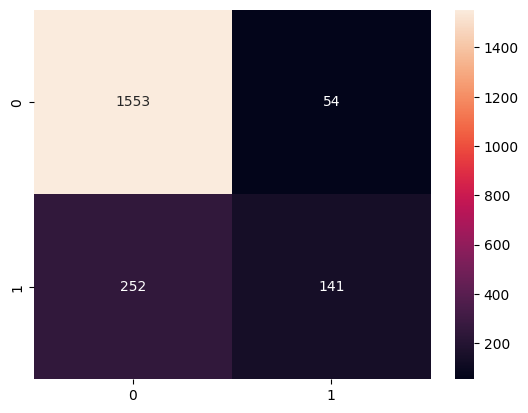

In [17]:
# print confusion matrix
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
cm = confusion_matrix(Y_test, Y_pred)
sns.heatmap(cm, annot=True, fmt='d')

In [20]:
!pip install tensorboard


[notice] A new release of pip is available: 24.1.2 -> 24.2
[notice] To update, run: python.exe -m pip install --upgrade pip


In [18]:
import tensorflow as tf
# Create a log directory for TensorBoard
log_dir = "logs/fit/" 
# Define a callback to log data for TensorBoard
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)

ModuleNotFoundError: No module named 'tensorflow'

In [19]:
%load_ext tensorboard
# show tensorboard
%tensorboard --logdir logs

ERROR: Could not find `tensorboard`. Please ensure that your PATH
contains an executable `tensorboard` program, or explicitly specify
the path to a TensorBoard binary by setting the `TENSORBOARD_BINARY`
environment variable.